**Python code for Dividing the historical data into a (75:25) Train-Test data split for Time Series XGBoost Forecasting Model**

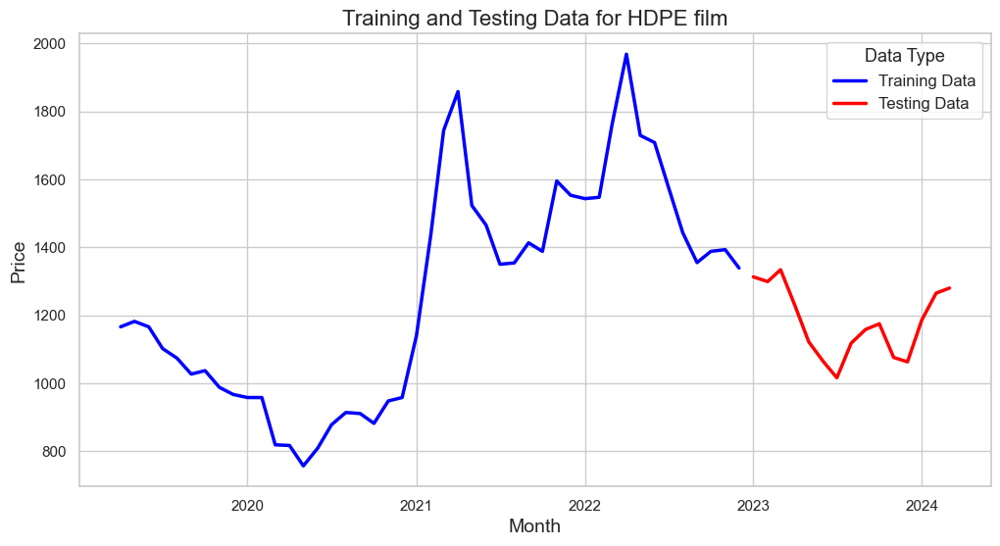

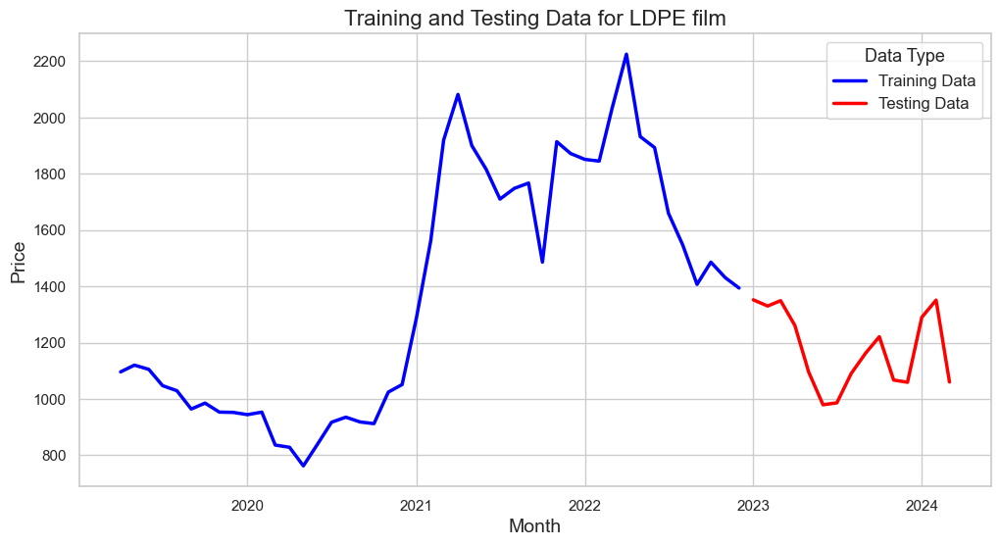

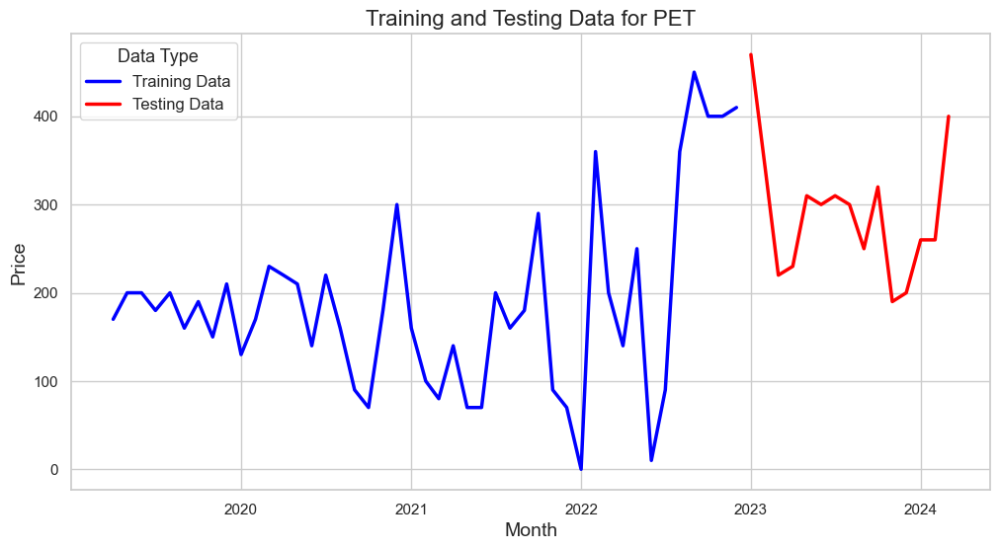

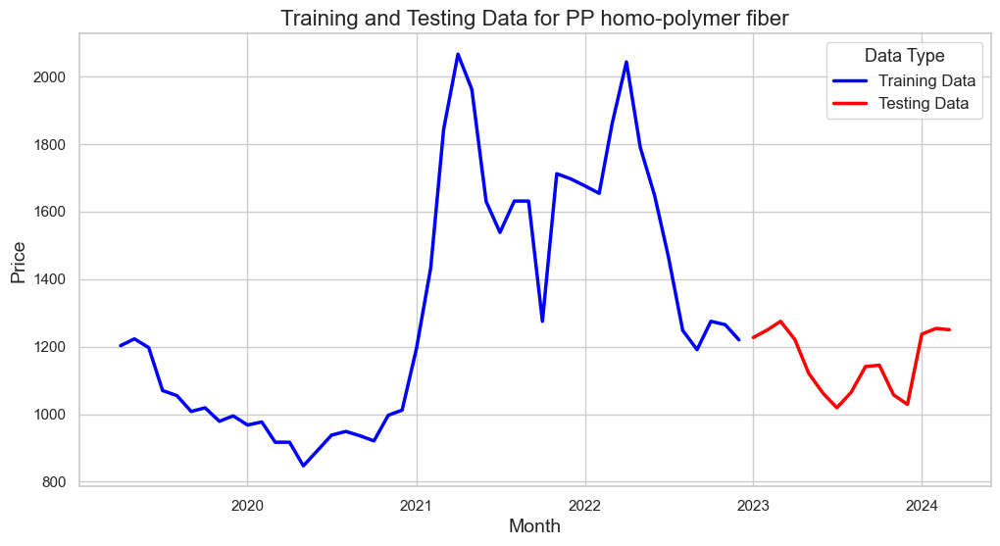

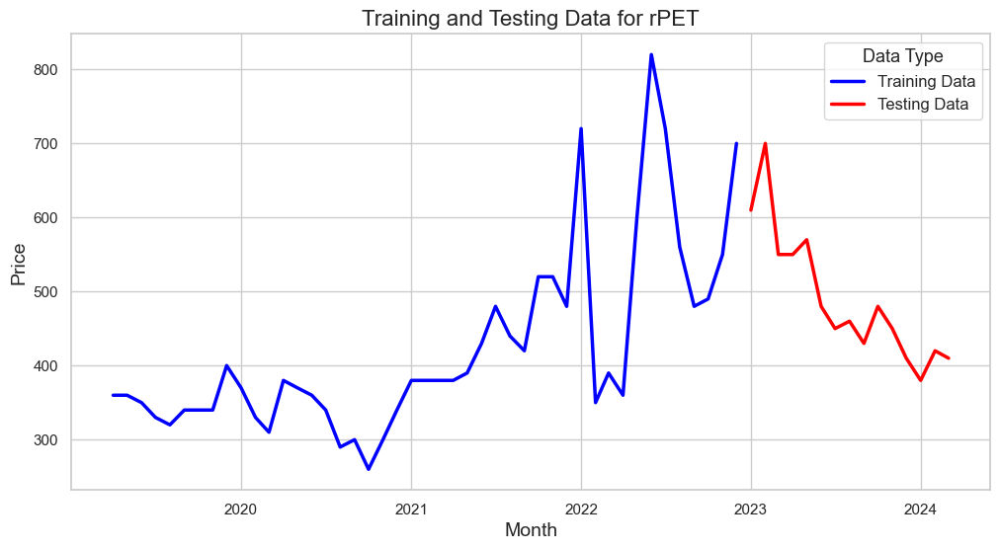

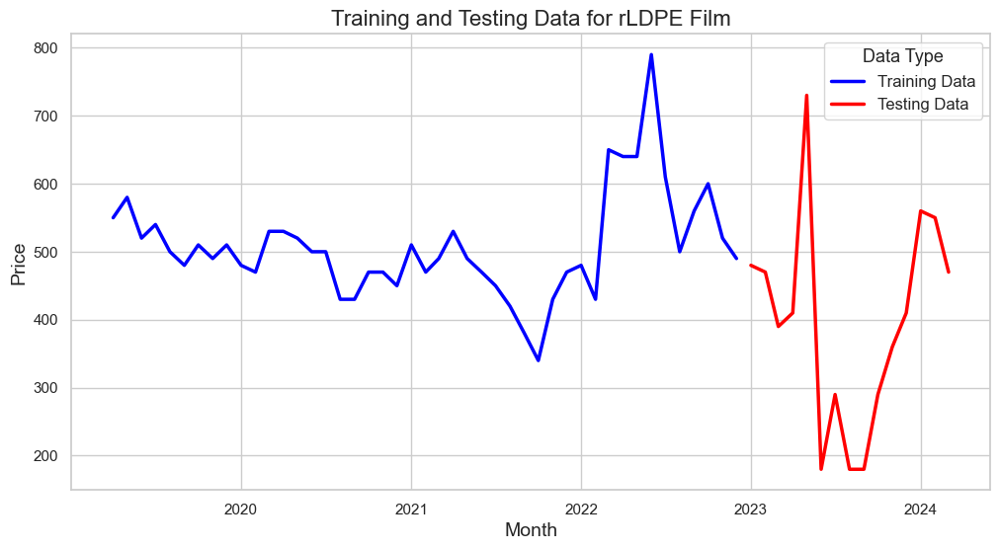

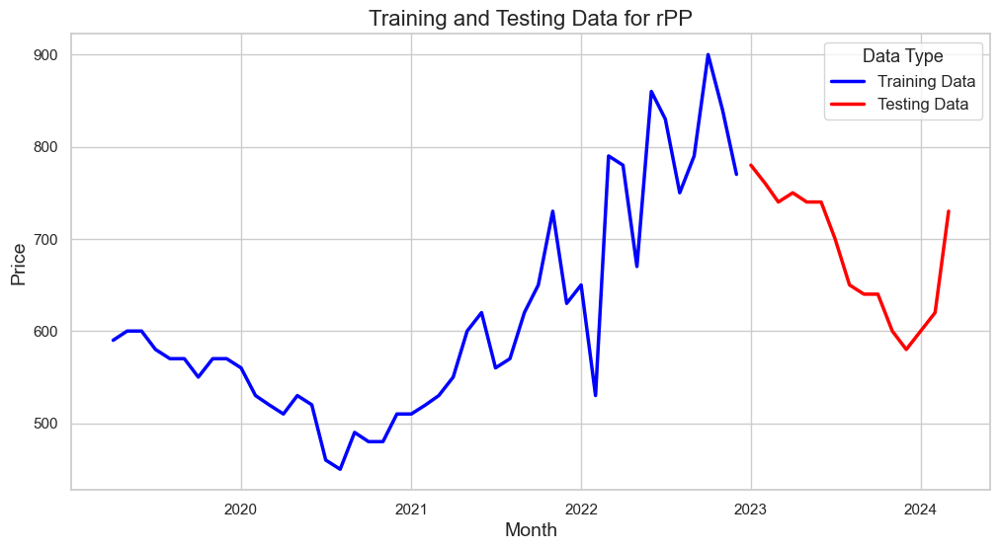

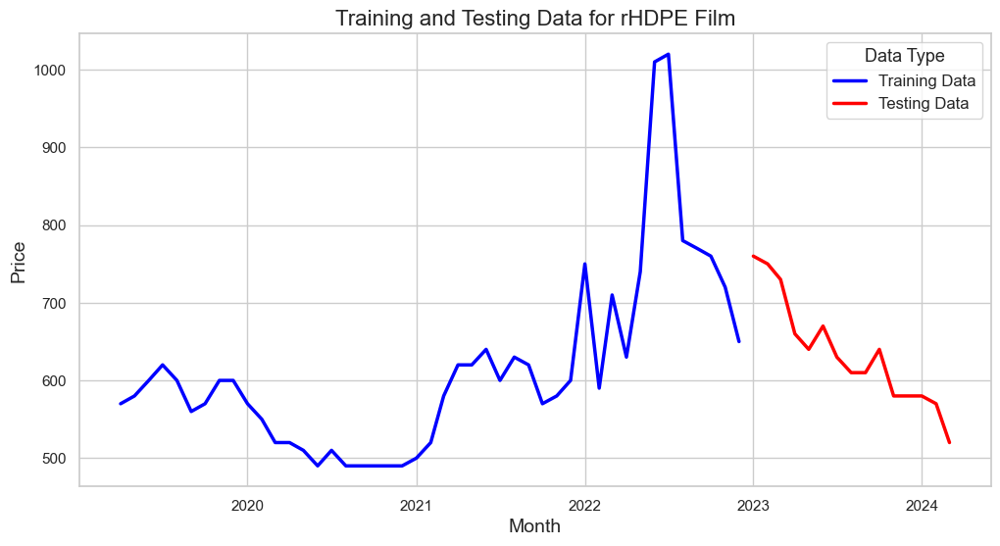

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'data' is the dictionary containing the historical data
data = {
    'Month': ['Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 'Dec-19',
              'Jan-20', 'Feb-20', 'Mar-20', 'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20',
              'Oct-20', 'Nov-20', 'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21', 'Jun-21',
              'Jul-21', 'Aug-21', 'Sep-21', 'Oct-21', 'Nov-21', 'Dec-21', 'Jan-22', 'Feb-22', 'Mar-22',
              'Apr-22', 'May-22', 'Jun-22', 'Jul-22', 'Aug-22', 'Sep-22', 'Oct-22', 'Nov-22', 'Dec-22',
              'Jan-23', 'Feb-23', 'Mar-23', 'Apr-23', 'May-23', 'Jun-23', 'Jul-23', 'Aug-23', 'Sep-23',
              'Oct-23', 'Nov-23', 'Dec-23', 'Jan-24', 'Feb-24', 'Mar-24'],
    'HDPE film': [1166, 1182, 1166, 1102, 1074, 1027, 1037, 988, 967, 958, 958, 819, 817, 757, 809, 878,
                  914, 911, 882, 948, 958, 1140, 1435, 1744, 1858, 1523, 1465, 1350, 1354, 1413, 1388,
                  1595, 1553, 1543, 1547, 1762, 1968, 1729, 1708, 1577, 1443, 1355, 1388, 1393, 1339,
                  1313, 1299, 1334, 1229, 1122, 1065, 1016, 1118, 1158, 1175, 1076, 1063, 1186, 1265, 1280],
    'LDPE film': [1096, 1120, 1105, 1047, 1029, 964, 985, 953, 952, 944, 953, 836, 828, 762, 840, 917,
                  935, 918, 912, 1024, 1051, 1288, 1562, 1920, 2082, 1900, 1816, 1710, 1748, 1767, 1486,
                  1914, 1872, 1851, 1845, 2033, 2225, 1932, 1893, 1660, 1547, 1407, 1486, 1431, 1394,
                  1352, 1330, 1349, 1261, 1095, 979, 986, 1090, 1162, 1221, 1067, 1059, 1290, 1351, 1060],
    'PET': [170, 200, 200, 180, 200, 160, 190, 150, 210, 130, 170, 230, 220, 210, 140, 220, 160, 90, 70,
            180, 300, 160, 100, 80, 140, 70, 70, 200, 160, 180, 290, 90, 70, 0, 360, 200, 140, 250, 10,
            90, 360, 450, 400, 400, 410, 470, 340, 220, 230, 310, 300, 310, 300, 250, 320, 190, 200, 260, 260, 400],
    'PP homo-polymer fiber': [1203, 1223, 1197, 1070, 1055, 1008, 1019, 979, 995, 968, 977, 917, 917,
                              847, 893, 938, 949, 936, 921, 997, 1012, 1194, 1434, 1844, 2066, 1962,
                              1630, 1538, 1631, 1631, 1275, 1712, 1697, 1676, 1654, 1860, 2043, 1790,
                              1648, 1466, 1248, 1191, 1275, 1265, 1220, 1227, 1250, 1275, 1221, 1121,
                              1062, 1019, 1065, 1141, 1145, 1057, 1029, 1237, 1254, 1250],
    'rPET': [360, 360, 350, 330, 320, 340, 340, 340, 400, 370, 330, 310, 380, 370, 360, 340, 290, 300,
             260, 300, 340, 380, 380, 380, 380, 390, 430, 480, 440, 420, 520, 520, 480, 720, 350, 390,
             360, 600, 820, 720, 560, 480, 490, 550, 700, 610, 700, 550, 550, 570, 480, 450, 460, 430,
             480, 450, 410, 380, 420, 410],
    'rLDPE Film': [550, 580, 520, 540, 500, 480, 510, 490, 510, 480, 470, 530, 530, 520, 500, 500, 430,
                   430, 470, 470, 450, 510, 470, 490, 530, 490, 470, 450, 420, 380, 340, 430, 470, 480,
                   430, 650, 640, 640, 790, 610, 500, 560, 600, 520, 490, 480, 470, 390, 410, 730, 180,
                   290, 180, 180, 290, 360, 410, 560, 550, 470],
    'rPP': [590, 600, 600, 580, 570, 570, 550, 570, 570, 560, 530, 520, 510, 530, 520, 460, 450, 490,
            480, 480, 510, 510, 520, 530, 550, 600, 620, 560, 570, 620, 650, 730, 630, 650, 530, 790,
            780, 670, 860, 830, 750, 790, 900, 840, 770, 780, 760, 740, 750, 740, 740, 700, 650, 640,
            640, 600, 580, 600, 620, 730],
    'rHDPE Film': [570, 580, 600, 620, 600, 560, 570, 600, 600, 570, 550, 520, 520, 510, 490, 510, 490,
                   490, 490, 490, 490, 500, 520, 580, 620, 620, 640, 600, 630, 620, 570, 580, 600, 750,
                   590, 710, 630, 740, 1010, 1020, 780, 770, 760, 720, 650, 760, 750, 730, 660, 640,
                   670, 630, 610, 610, 640, 580, 580, 580, 570, 520]
}

# Convert 'Month' column to datetime and set it as index
df = pd.DataFrame(data)
df['Month'] = pd.to_datetime(df['Month'], format='%b-%y')
df.set_index('Month', inplace=True)

# Split the data into training (75%) and validation (25%) sets
train_size = int(0.75 * len(df))
train_data = df.iloc[:train_size]
validation_data = df.iloc[train_size:]

# Set the color palette and style for better visualization
sns.set(style="whitegrid")

# Plotting the training and testing data using seaborn for better visualization
for compound in df.columns:
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=train_data[compound], label='Training Data', color='blue', linewidth=2.5)
    sns.lineplot(data=validation_data[compound], label='Testing Data', color='red', linewidth=2.5)
    plt.title(f'Training and Testing Data for {compound}', fontsize=16)
    plt.xlabel('Month', fontsize=14)
    plt.ylabel('Price', fontsize=14)
    plt.legend(title='Data Type', title_fontsize='13', fontsize='12')
    plt.show()

**Specifications Guide European Chemicals (2024). [Polymer Market Chemical Guidelines]. S&P Global Commodity Insights.**

In [16]:
import pandas as pd

# Define the data
data = {
    'Polymer Compounds': ['HDPE film', 'LDPE film', 'PET', 'PP homo-polymer fiber'],
    'Delivery Period (In days)': ['3-30 days', '3-30 days', '3-30 days', '3-30 days']
}

# Create DataFrame
df = pd.DataFrame(data)

# Print the DataFrame
print(df)

       Polymer Compounds Delivery Period (In days)
0              HDPE film                 3-30 days
1              LDPE film                 3-30 days
2                    PET                 3-30 days
3  PP homo-polymer fiber                 3-30 days


**Python Code for Graphviz installer package installation**

In [4]:
pip install graphviz

   ---------------------------------------- 0.0/47.1 kB ? eta -:--:--
   ---------------------------------- ----- 41.0/47.1 kB 991.0 kB/s eta 0:00:01
   ---------------------------------------- 47.1/47.1 kB 1.2 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


**Python Code generating Relevant Statistics from Historical Data**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'data' is the dictionary containing the historical data
data = {
    'Month': ['Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 'Dec-19',
              'Jan-20', 'Feb-20', 'Mar-20', 'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20',
              'Oct-20', 'Nov-20', 'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21', 'Jun-21',
              'Jul-21', 'Aug-21', 'Sep-21', 'Oct-21', 'Nov-21', 'Dec-21', 'Jan-22', 'Feb-22', 'Mar-22',
              'Apr-22', 'May-22', 'Jun-22', 'Jul-22', 'Aug-22', 'Sep-22', 'Oct-22', 'Nov-22', 'Dec-22',
              'Jan-23', 'Feb-23', 'Mar-23', 'Apr-23', 'May-23', 'Jun-23', 'Jul-23', 'Aug-23', 'Sep-23',
              'Oct-23', 'Nov-23', 'Dec-23', 'Jan-24', 'Feb-24', 'Mar-24'],
    'HDPE film': [1166, 1182, 1166, 1102, 1074, 1027, 1037, 988, 967, 958, 958, 819, 817, 757, 809, 878,
                  914, 911, 882, 948, 958, 1140, 1435, 1744, 1858, 1523, 1465, 1350, 1354, 1413, 1388,
                  1595, 1553, 1543, 1547, 1762, 1968, 1729, 1708, 1577, 1443, 1355, 1388, 1393, 1339,
                  1313, 1299, 1334, 1229, 1122, 1065, 1016, 1118, 1158, 1175, 1076, 1063, 1186, 1265, 1280],
    'LDPE film': [1096, 1120, 1105, 1047, 1029, 964, 985, 953, 952, 944, 953, 836, 828, 762, 840, 917,
                  935, 918, 912, 1024, 1051, 1288, 1562, 1920, 2082, 1900, 1816, 1710, 1748, 1767, 1486,
                  1914, 1872, 1851, 1845, 2033, 2225, 1932, 1893, 1660, 1547, 1407, 1486, 1431, 1394,
                  1352, 1330, 1349, 1261, 1095, 979, 986, 1090, 1162, 1221, 1067, 1059, 1290, 1351, 1060],
    'PET': [170, 200, 200, 180, 200, 160, 190, 150, 210, 130, 170, 230, 220, 210, 140, 220, 160, 90, 70,
            180, 300, 160, 100, 80, 140, 70, 70, 200, 160, 180, 290, 90, 70, 0, 360, 200, 140, 250, 10,
            90, 360, 450, 400, 400, 410, 470, 340, 220, 230, 310, 300, 310, 300, 250, 320, 190, 200, 260, 260, 400],
    'PP homo-polymer fiber': [1203, 1223, 1197, 1070, 1055, 1008, 1019, 979, 995, 968, 977, 917, 917,
                              847, 893, 938, 949, 936, 921, 997, 1012, 1194, 1434, 1844, 2066, 1962,
                              1630, 1538, 1631, 1631, 1275, 1712, 1697, 1676, 1654, 1860, 2043, 1790,
                              1648, 1466, 1248, 1191, 1275, 1265, 1220, 1227, 1250, 1275, 1221, 1121,
                              1062, 1019, 1065, 1141, 1145, 1057, 1029, 1237, 1254, 1250],
    'rPET': [360, 360, 350, 330, 320, 340, 340, 340, 400, 370, 330, 310, 380, 370, 360, 340, 290, 300,
             260, 300, 340, 380, 380, 380, 380, 390, 430, 480, 440, 420, 520, 520, 480, 720, 350, 390,
             360, 600, 820, 720, 560, 480, 490, 550, 700, 610, 700, 550, 550, 570, 480, 450, 460, 430,
             480, 450, 410, 380, 420, 410],
    'rLDPE Film': [550, 580, 520, 540, 500, 480, 510, 490, 510, 480, 470, 530, 530, 520, 500, 500, 430,
                   430, 470, 470, 450, 510, 470, 490, 530, 490, 470, 450, 420, 380, 340, 430, 470, 480,
                   430, 650, 640, 640, 790, 610, 500, 560, 600, 520, 490, 480, 470, 390, 410, 730, 180,
                   290, 180, 180, 290, 360, 410, 560, 550, 470],
    'rPP': [590, 600, 600, 580, 570, 570, 550, 570, 570, 560, 530, 520, 510, 530, 520, 460, 450, 490,
            480, 480, 510, 510, 520, 530, 550, 600, 620, 560, 570, 620, 650, 730, 630, 650, 530, 790,
            780, 670, 860, 830, 750, 790, 900, 840, 770, 780, 760, 740, 750, 740, 740, 700, 650, 640,
            640, 600, 580, 600, 620, 730],
    'rHDPE Film': [570, 580, 600, 620, 600, 560, 570, 600, 600, 570, 550, 520, 520, 510, 490, 510, 490,
                   490, 490, 490, 490, 500, 520, 580, 620, 620, 640, 600, 630, 620, 570, 580, 600, 750,
                   590, 710, 630, 740, 1010, 1020, 780, 770, 760, 720, 650, 760, 750, 730, 660, 640,
                   670, 630, 610, 610, 640, 580, 580, 580, 570, 520]
}

# Convert 'Month' column to datetime and set it as index
df = pd.DataFrame(data)
df['Month'] = pd.to_datetime(df['Month'], format='%b-%y')
df.set_index('Month', inplace=True)


In [2]:
df.describe()

,HDPE film,LDPE film,PET,PP homo-polymer fiber,rPET,rLDPE Film,rPP,rHDPE Film
count,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000
mean,1243.116667,1326.533333,213.666667,1272.066667,439.666667,479.500000,629.333333,619.333333
std,286.557776,392.274051,107.624058,320.775695,121.054220,112.256139,111.459754,108.797225
min,757.000000,762.000000,0.000000,847.000000,260.000000,180.000000,450.000000,490.000000
25%,1024.250000,985.750000,147.500000,1017.250000,357.500000,430.000000,545.000000,567.500000
50%,1184.000000,1241.000000,200.000000,1211.500000,405.000000,485.000000,600.000000,600.000000
75%,1418.500000,1672.500000,292.500000,1484.000000,482.500000,530.000000,732.500000,642.500000
max,1968.000000,2225.000000,470.000000,2066.000000,820.000000,790.000000,900.000000,1020.000000


In [3]:
df.head()

,HDPE film,LDPE film,PET,PP homo-polymer fiber,rPET,rLDPE Film,rPP,rHDPE Film
Month,,,,,,,,
2019-04-01,1166,1096,170,1203,360,550,590,570
2019-05-01,1182,1120,200,1223,360,580,600,580
2019-06-01,1166,1105,200,1197,350,520,600,600
2019-07-01,1102,1047,180,1070,330,540,580,620
2019-08-01,1074,1029,200,1055,320,500,570,600


In [4]:
df.tail()

,HDPE film,LDPE film,PET,PP homo-polymer fiber,rPET,rLDPE Film,rPP,rHDPE Film
Month,,,,,,,,
2023-11-01,1076,1067,190,1057,450,360,600,580
2023-12-01,1063,1059,200,1029,410,410,580,580
2024-01-01,1186,1290,260,1237,380,560,600,580
2024-02-01,1265,1351,260,1254,420,550,620,570
2024-03-01,1280,1060,400,1250,410,470,730,520


In [8]:
df

,HDPE film,LDPE film,PET,PP homo-polymer fiber,rPET,rLDPE Film,rPP,rHDPE Film
Month,,,,,,,,
2019-04-01,1166,1096,170,1203,360,550,590,570
2019-05-01,1182,1120,200,1223,360,580,600,580
2019-06-01,1166,1105,200,1197,350,520,600,600
2019-07-01,1102,1047,180,1070,330,540,580,620
2019-08-01,1074,1029,200,1055,320,500,570,600
2019-09-01,1027,964,160,1008,340,480,570,560
2019-10-01,1037,985,190,1019,340,510,550,570
2019-11-01,988,953,150,979,340,490,570,600
2019-12-01,967,952,210,995,400,510,570,600


**Python Code for Monte Carlo Forward Price Simulation model**

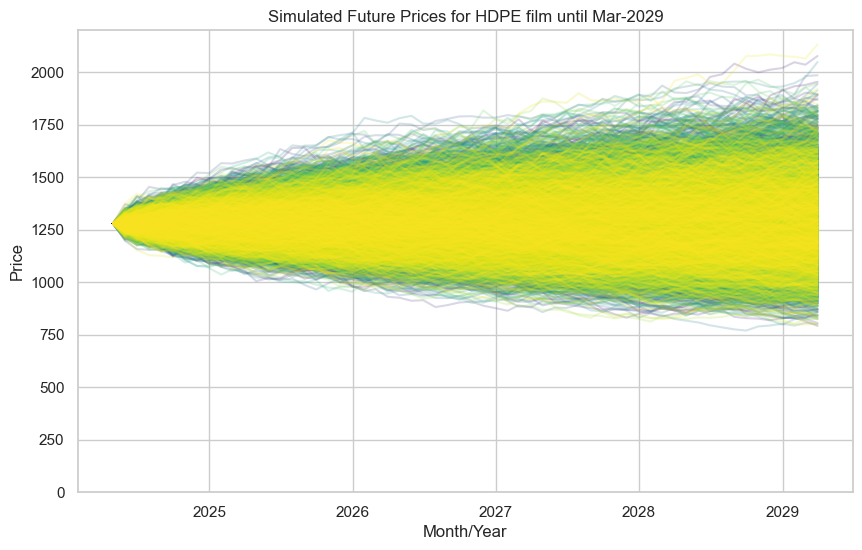


Expected Future Prices at Different Time Steps for HDPE film until Mar-2029:
April 2024: €1280.00
May 2024: €1279.86
June 2024: €1279.97
July 2024: €1279.99
August 2024: €1280.15
September 2024: €1279.79
October 2024: €1279.71
November 2024: €1279.63
December 2024: €1279.73
January 2025: €1280.15
February 2025: €1280.30
March 2025: €1280.40
April 2025: €1280.42
May 2025: €1280.28
June 2025: €1280.49
July 2025: €1280.63
August 2025: €1280.72
September 2025: €1280.44
October 2025: €1280.70
November 2025: €1280.57
December 2025: €1280.73
January 2026: €1280.67
February 2026: €1280.58
March 2026: €1280.26
April 2026: €1280.21
May 2026: €1279.99
June 2026: €1280.26
July 2026: €1280.37
August 2026: €1280.26
September 2026: €1280.60
October 2026: €1280.55
November 2026: €1280.77
December 2026: €1280.78
January 2027: €1281.09
February 2027: €1281.08
March 2027: €1281.05
April 2027: €1281.04
May 2027: €1281.27
June 2027: €1280.97
July 2027: €1281.14
August 2027: €1281.28
September 2027: €1280.

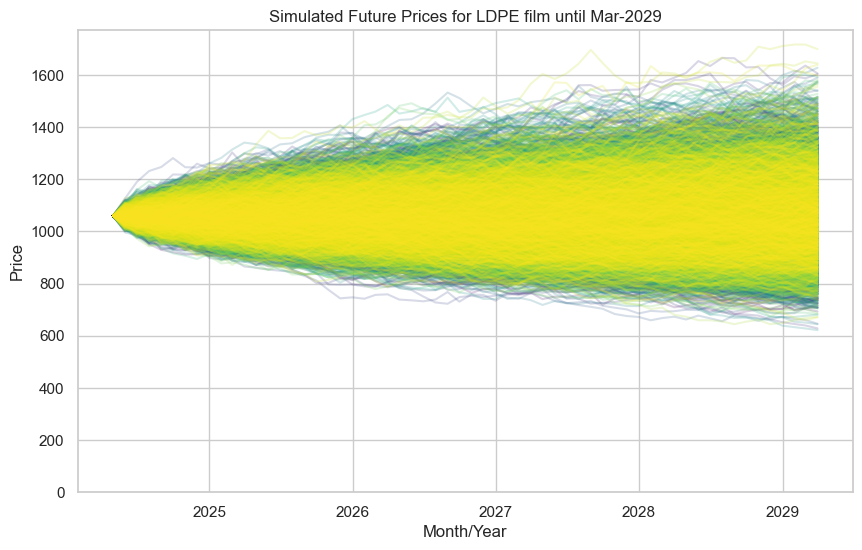


Expected Future Prices at Different Time Steps for LDPE film until Mar-2029:
April 2024: €1060.00
May 2024: €1059.79
June 2024: €1059.94
July 2024: €1059.85
August 2024: €1059.75
September 2024: €1059.57
October 2024: €1059.39
November 2024: €1059.59
December 2024: €1059.73
January 2025: €1059.64
February 2025: €1059.03
March 2025: €1059.23
April 2025: €1059.42
May 2025: €1059.39
June 2025: €1059.09
July 2025: €1059.16
August 2025: €1059.32
September 2025: €1059.48
October 2025: €1059.46
November 2025: €1059.54
December 2025: €1059.09
January 2026: €1059.03
February 2026: €1059.06
March 2026: €1058.67
April 2026: €1058.70
May 2026: €1058.84
June 2026: €1058.67
July 2026: €1058.49
August 2026: €1058.47
September 2026: €1058.40
October 2026: €1058.47
November 2026: €1058.27
December 2026: €1058.05
January 2027: €1057.84
February 2027: €1058.06
March 2027: €1057.99
April 2027: €1057.91
May 2027: €1058.11
June 2027: €1058.47
July 2027: €1058.76
August 2027: €1058.83
September 2027: €1058.

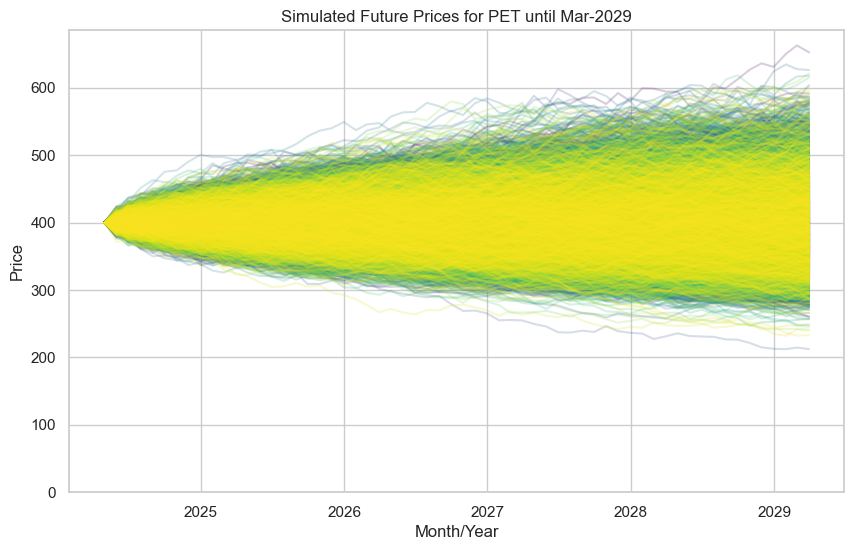


Expected Future Prices at Different Time Steps for PET until Mar-2029:
April 2024: €400.00
May 2024: €399.89
June 2024: €399.98
July 2024: €399.97
August 2024: €399.90
September 2024: €399.94
October 2024: €399.94
November 2024: €399.98
December 2024: €399.89
January 2025: €400.02
February 2025: €399.98
March 2025: €400.11
April 2025: €400.14
May 2025: €400.19
June 2025: €400.20
July 2025: €400.13
August 2025: €400.17
September 2025: €400.16
October 2025: €400.03
November 2025: €400.06
December 2025: €400.02
January 2026: €400.12
February 2026: €400.13
March 2026: €400.29
April 2026: €400.36
May 2026: €400.27
June 2026: €400.31
July 2026: €400.28
August 2026: €400.34
September 2026: €400.33
October 2026: €400.27
November 2026: €400.28
December 2026: €400.21
January 2027: €400.25
February 2027: €400.21
March 2027: €400.26
April 2027: €400.30
May 2027: €400.36
June 2027: €400.38
July 2027: €400.27
August 2027: €400.29
September 2027: €400.25
October 2027: €400.28
November 2027: €400.20


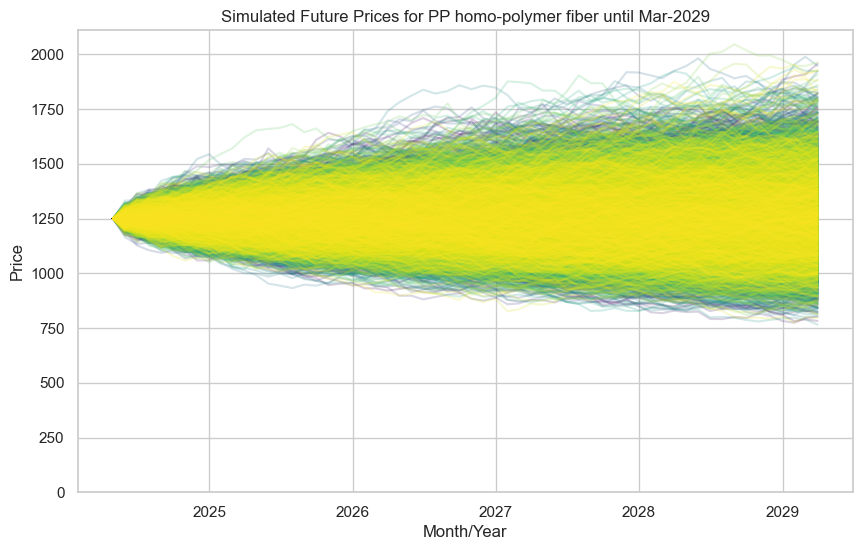


Expected Future Prices at Different Time Steps for PP homo-polymer fiber until Mar-2029:
April 2024: €1250.00
May 2024: €1249.82
June 2024: €1250.20
July 2024: €1250.09
August 2024: €1250.21
September 2024: €1250.49
October 2024: €1250.74
November 2024: €1250.95
December 2024: €1250.82
January 2025: €1250.89
February 2025: €1250.79
March 2025: €1251.14
April 2025: €1251.02
May 2025: €1251.16
June 2025: €1251.15
July 2025: €1251.56
August 2025: €1251.65
September 2025: €1251.83
October 2025: €1251.72
November 2025: €1251.53
December 2025: €1251.63
January 2026: €1251.84
February 2026: €1251.56
March 2026: €1251.50
April 2026: €1251.78
May 2026: €1251.71
June 2026: €1251.58
July 2026: €1251.65
August 2026: €1251.75
September 2026: €1251.84
October 2026: €1251.76
November 2026: €1251.77
December 2026: €1251.70
January 2027: €1251.87
February 2027: €1251.77
March 2027: €1251.85
April 2027: €1252.21
May 2027: €1252.14
June 2027: €1252.47
July 2027: €1252.26
August 2027: €1252.46
September 

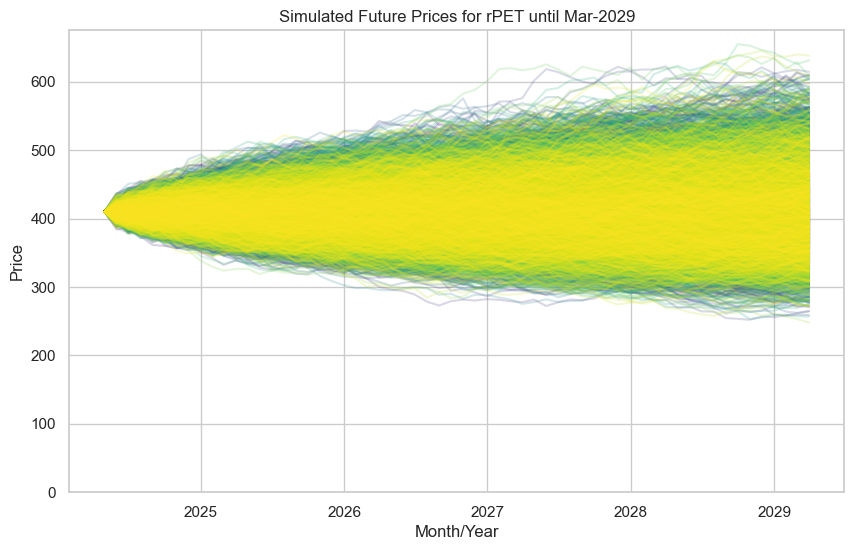


Expected Future Prices at Different Time Steps for rPET until Mar-2029:
April 2024: €410.00
May 2024: €409.89
June 2024: €409.84
July 2024: €409.75
August 2024: €409.85
September 2024: €409.81
October 2024: €409.70
November 2024: €409.82
December 2024: €409.82
January 2025: €409.86
February 2025: €409.96
March 2025: €409.83
April 2025: €409.95
May 2025: €410.00
June 2025: €409.93
July 2025: €409.99
August 2025: €410.05
September 2025: €410.05
October 2025: €410.13
November 2025: €410.00
December 2025: €409.97
January 2026: €409.97
February 2026: €410.15
March 2026: €410.20
April 2026: €410.29
May 2026: €410.31
June 2026: €410.36
July 2026: €410.43
August 2026: €410.46
September 2026: €410.47
October 2026: €410.50
November 2026: €410.50
December 2026: €410.62
January 2027: €410.63
February 2027: €410.62
March 2027: €410.61
April 2027: €410.69
May 2027: €410.60
June 2027: €410.65
July 2027: €410.74
August 2027: €410.77
September 2027: €410.89
October 2027: €410.98
November 2027: €411.03

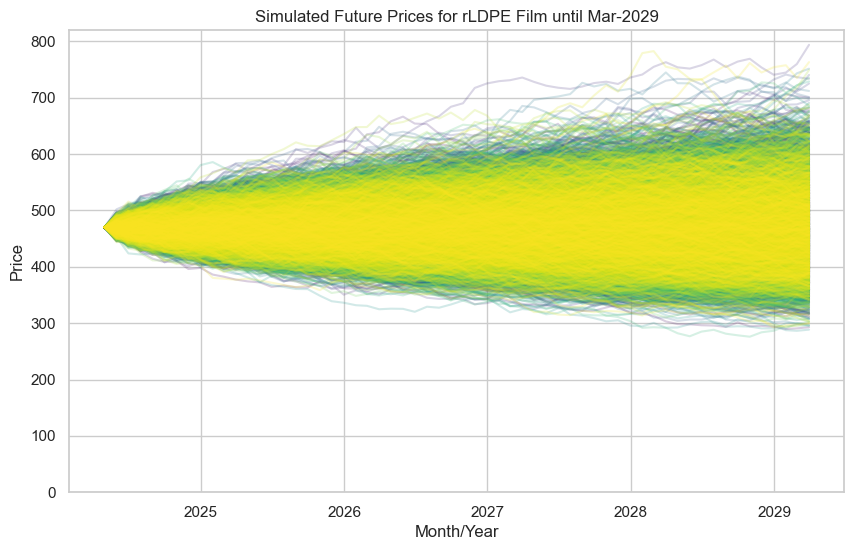


Expected Future Prices at Different Time Steps for rLDPE Film until Mar-2029:
April 2024: €470.00
May 2024: €469.92
June 2024: €469.80
July 2024: €469.78
August 2024: €469.91
September 2024: €470.04
October 2024: €470.01
November 2024: €470.02
December 2024: €470.11
January 2025: €470.00
February 2025: €469.90
March 2025: €469.90
April 2025: €469.84
May 2025: €469.73
June 2025: €469.62
July 2025: €469.61
August 2025: €469.58
September 2025: €469.58
October 2025: €469.61
November 2025: €469.61
December 2025: €469.34
January 2026: €469.31
February 2026: €469.20
March 2026: €469.24
April 2026: €469.14
May 2026: €469.35
June 2026: €469.21
July 2026: €469.31
August 2026: €469.22
September 2026: €469.29
October 2026: €469.33
November 2026: €469.27
December 2026: €469.34
January 2027: €469.31
February 2027: €469.23
March 2027: €469.23
April 2027: €469.31
May 2027: €469.39
June 2027: €469.54
July 2027: €469.50
August 2027: €469.40
September 2027: €469.43
October 2027: €469.38
November 2027: €

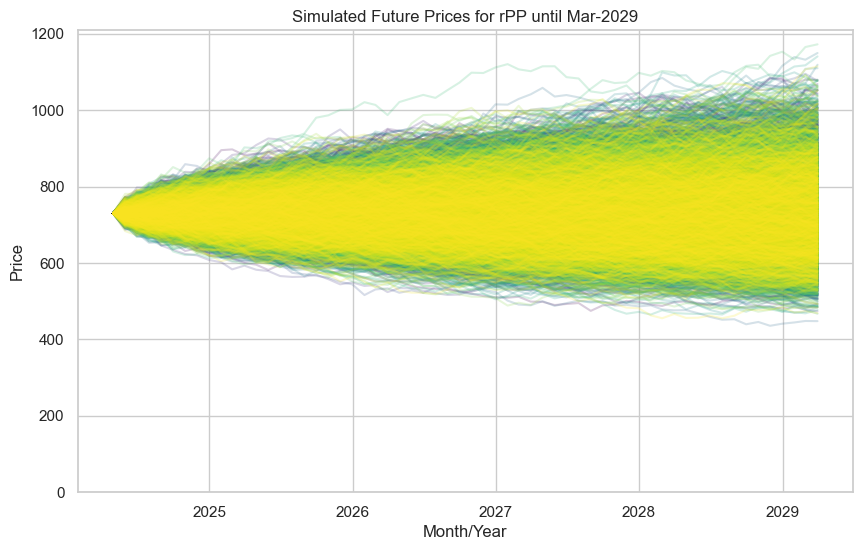


Expected Future Prices at Different Time Steps for rPP until Mar-2029:
April 2024: €730.00
May 2024: €730.19
June 2024: €730.32
July 2024: €730.51
August 2024: €730.56
September 2024: €730.48
October 2024: €730.47
November 2024: €730.55
December 2024: €730.48
January 2025: €730.38
February 2025: €730.53
March 2025: €730.75
April 2025: €730.73
May 2025: €730.72
June 2025: €730.76
July 2025: €730.88
August 2025: €730.99
September 2025: €731.13
October 2025: €731.18
November 2025: €731.13
December 2025: €731.09
January 2026: €731.17
February 2026: €731.34
March 2026: €731.20
April 2026: €731.25
May 2026: €731.13
June 2026: €731.15
July 2026: €731.13
August 2026: €730.92
September 2026: €731.04
October 2026: €731.13
November 2026: €731.11
December 2026: €731.07
January 2027: €731.08
February 2027: €731.08
March 2027: €730.91
April 2027: €731.00
May 2027: €731.04
June 2027: €731.13
July 2027: €731.49
August 2027: €731.33
September 2027: €731.37
October 2027: €731.14
November 2027: €731.28


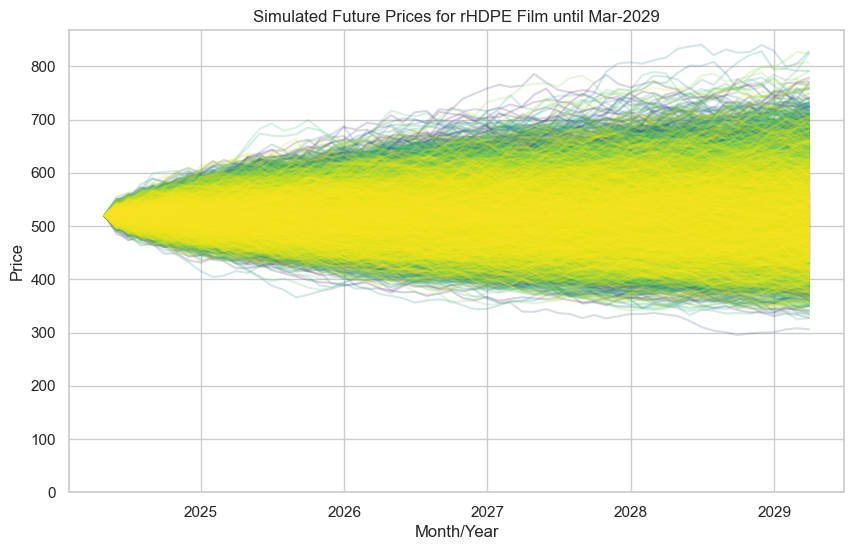


Expected Future Prices at Different Time Steps for rHDPE Film until Mar-2029:
April 2024: €520.00
May 2024: €520.02
June 2024: €520.02
July 2024: €520.06
August 2024: €520.08
September 2024: €520.06
October 2024: €520.18
November 2024: €520.20
December 2024: €520.18
January 2025: €520.12
February 2025: €520.03
March 2025: €520.06
April 2025: €519.91
May 2025: €520.05
June 2025: €520.18
July 2025: €520.18
August 2025: €520.17
September 2025: €520.13
October 2025: €520.09
November 2025: €520.00
December 2025: €519.99
January 2026: €519.96
February 2026: €519.99
March 2026: €520.09
April 2026: €520.05
May 2026: €519.99
June 2026: €520.02
July 2026: €519.96
August 2026: €520.09
September 2026: €520.07
October 2026: €520.03
November 2026: €520.01
December 2026: €519.96
January 2027: €519.85
February 2027: €519.55
March 2027: €519.42
April 2027: €519.45
May 2027: €519.46
June 2027: €519.36
July 2027: €519.27
August 2027: €519.39
September 2027: €519.39
October 2027: €519.41
November 2027: €

In [10]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Set the aesthetic parameters in one step
sns.set(style="whitegrid")

# Define the data
data = {
    'Month': ['Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 'Dec-19',
              'Jan-20', 'Feb-20', 'Mar-20', 'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20',
              'Oct-20', 'Nov-20', 'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21', 'Jun-21',
              'Jul-21', 'Aug-21', 'Sep-21', 'Oct-21', 'Nov-21', 'Dec-21', 'Jan-22', 'Feb-22', 'Mar-22',
              'Apr-22', 'May-22', 'Jun-22', 'Jul-22', 'Aug-22', 'Sep-22', 'Oct-22', 'Nov-22', 'Dec-22',
              'Jan-23', 'Feb-23', 'Mar-23', 'Apr-23', 'May-23', 'Jun-23', 'Jul-23', 'Aug-23', 'Sep-23',
              'Oct-23', 'Nov-23', 'Dec-23', 'Jan-24', 'Feb-24', 'Mar-24'],
    'HDPE film': [1166, 1182, 1166, 1102, 1074, 1027, 1037, 988, 967, 958, 958, 819, 817, 757, 809, 878,
                  914, 911, 882, 948, 958, 1140, 1435, 1744, 1858, 1523, 1465, 1350, 1354, 1413, 1388,
                  1595, 1553, 1543, 1547, 1762, 1968, 1729, 1708, 1577, 1443, 1355, 1388, 1393, 1339,
                  1313, 1299, 1334, 1229, 1122, 1065, 1016, 1118, 1158, 1175, 1076, 1063, 1186, 1265, 1280],
    'LDPE film': [1096, 1120, 1105, 1047, 1029, 964, 985, 953, 952, 944, 953, 836, 828, 762, 840, 917,
                  935, 918, 912, 1024, 1051, 1288, 1562, 1920, 2082, 1900, 1816, 1710, 1748, 1767, 1486,
                  1914, 1872, 1851, 1845, 2033, 2225, 1932, 1893, 1660, 1547, 1407, 1486, 1431, 1394,
                  1352, 1330, 1349, 1261, 1095, 979, 986, 1090, 1162, 1221, 1067, 1059, 1290, 1351, 1060],
    'PET': [170, 200, 200, 180, 200, 160, 190, 150, 210, 130, 170, 230, 220, 210, 140, 220, 160, 90, 70,
            180, 300, 160, 100, 80, 140, 70, 70, 200, 160, 180, 290, 90, 70, 0, 360, 200, 140, 250, 10,
            90, 360, 450, 400, 400, 410, 470, 340, 220, 230, 310, 300, 310, 300, 250, 320, 190, 200, 260, 260, 400],
    'PP homo-polymer fiber': [1203, 1223, 1197, 1070, 1055, 1008, 1019, 979, 995, 968, 977, 917, 917,
                              847, 893, 938, 949, 936, 921, 997, 1012, 1194, 1434, 1844, 2066, 1962,
                              1630, 1538, 1631, 1631, 1275, 1712, 1697, 1676, 1654, 1860, 2043, 1790,
                              1648, 1466, 1248, 1191, 1275, 1265, 1220, 1227, 1250, 1275, 1221, 1121,
                              1062, 1019, 1065, 1141, 1145, 1057, 1029, 1237, 1254, 1250],
    'rPET': [360, 360, 350, 330, 320, 340, 340, 340, 400, 370, 330, 310, 380, 370, 360, 340, 290, 300, 260, 300, 340, 380, 380, 380, 380, 390, 430, 480, 440, 420, 520, 520, 480, 720, 350, 390, 360, 600, 820, 720, 560, 480, 490, 550, 700, 610, 700, 550, 550, 570, 480, 450, 460, 430, 480, 450, 410, 380, 420, 410],
    'rLDPE Film': [550, 580, 520, 540, 500, 480, 510, 490, 510, 480, 470, 530, 530, 520, 500, 500, 430, 430, 470, 470, 450, 510, 470, 490, 530, 490, 470, 450, 420, 380, 340, 430, 470, 480, 430, 650, 640, 640, 790, 610, 500, 560, 600, 520, 490, 480, 470, 390, 410, 730, 180, 290, 180, 180, 290, 360, 410, 560, 550, 470],
    'rPP': [590, 600, 600, 580, 570, 570, 550, 570, 570, 560, 530, 520, 510, 530, 520, 460, 450, 490, 480, 480, 510, 510, 520, 530, 550, 600, 620, 560, 570, 620, 650, 730, 630, 650, 530, 790, 780, 670, 860, 830, 750, 790, 900, 840, 770, 780, 760, 740, 750, 740, 740, 700, 650, 640, 640, 600, 580, 600, 620, 730],
    'rHDPE Film': [570, 580, 600, 620, 600, 560, 570, 600, 600, 570, 550, 520, 520, 510, 490, 510, 490, 490, 490, 490, 490, 500, 520, 580, 620, 620, 640, 600, 630, 620, 570, 580, 600, 750, 590, 710, 630, 740, 1010, 1020, 780, 770, 760, 720, 650, 760, 750, 730, 660, 640, 670, 630, 610, 610, 640, 580, 580, 580, 570, 520]
}

# Create DataFrame from the data dictionary
df = pd.DataFrame(data)
df['Month'] = pd.to_datetime(df['Month'], format='%b-%y')
df.set_index('Month', inplace=True)

# Data Preprocessing: Identify and treat outliers using the IQR method
def treat_outliers_iqr(df):
    for column in df.columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
        df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])
    return df

# Treat outliers in the DataFrame
df = treat_outliers_iqr(df)

# Interest rate for forward contracts
interest_rate = 0.0244  # 2.44%

# Delivery period for forward contracts
delivery_period = (3, 30)  # 3-30 days

# Define parameters and initialize variables for simulations
num_scenarios = 10000  # Number of scenarios for Monte Carlo simulation
n_months_future = 60  # Simulate future prices for the next 5 years (12 months * 5 years)
dt = 1 / 252  # Assuming daily data; adjust as needed

# Function to perform Monte Carlo simulation with specified parameters
def monte_carlo_simulation(s0, mu, sigma, n, num_scenarios, dt):
    prices = np.zeros((num_scenarios, n))
    for i in range(num_scenarios):
        price = np.zeros(n)
        price[0] = s0
        for t in range(1, n):
            simulated_return = (mu - 0.5 * sigma**2) * dt + sigma * np.sqrt(dt) * np.random.normal()
            next_price = price[t - 1] * np.exp(simulated_return)
            if next_price <= 0:
                prices[i, t:] = np.nan
                break
            price[t] = next_price
        prices[i, :t+1] = price[:t+1]
    return prices

# Adjust the start date for simulation to April 2024
start_date_future = pd.Timestamp('2024-04-01')

# Initialize simulated prices dictionary
simulated_prices_future = {}

# Loop over each polymer compound and perform simulation
for material in df.columns:
    # Simulate future prices with specified parameters starting from April 2024
    s0_future = df[material].iloc[-1]
    mu = 0.003  # Drift (mu) of 0.3%
    sigma = 0.27124  # Volatility (sigma) of 27.12%
    simulated_prices_future[material] = monte_carlo_simulation(s0_future, mu, sigma, n_months_future, num_scenarios, dt)

    # Create a DataFrame for plotting
    dates = pd.date_range(start=start_date_future, periods=n_months_future, freq='M')
    scenarios = np.arange(num_scenarios)
    multi_index = pd.MultiIndex.from_product([dates, scenarios], names=['Date', 'Scenario'])
    plot_data = pd.DataFrame(simulated_prices_future[material].T.flatten(), index=multi_index, columns=[material])
    plot_data = plot_data.reset_index()

    # Plot the distribution of future prices for each material until Mar-2029
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=plot_data, x='Date', y=material, hue='Scenario', palette='viridis', legend=None, alpha=0.2)
    plt.xlabel('Month/Year')
    plt.ylabel('Price')
    plt.title(f'Simulated Future Prices for {material} until Mar-2029')
    plt.ylim(0, None)  # Set y-axis limit to start from zero
    plt.show()

    # Calculate and print expected future prices at different time steps for each material until Mar-2029
    expected_prices_future = simulated_prices_future[material].mean(axis=0)
    print(f"\nExpected Future Prices at Different Time Steps for {material} until Mar-2029:")
    for month, price in zip(dates, expected_prices_future):
        print(f"{month.strftime('%B %Y')}: €{price:.2f}")

# Calculate and print MSE, MAE, RMSE, and MAPE for the overall model
def calculate_errors(actual, predicted):
    mse = mean_squared_error(actual, predicted)
    mae = mean_absolute_error(actual, predicted)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    return mse, mae, rmse, mape

# Assuming we have actual future prices for comparison (for demonstration purposes, using the last known prices)
actual_prices = df.iloc[-1].values

# Calculate errors for each material
for material in df.columns:
    predicted_prices = simulated_prices_future[material][:, -1]  # Using the last simulated prices
    mse, mae, rmse, mape = calculate_errors(np.full(predicted_prices.shape, actual_prices[df.columns.get_loc(material)]), predicted_prices)
    print(f"\nError Metrics for {material}:")
    print(f"Mean Squared Error (MSE): {mse:.2f}")
    print(f"Mean Absolute Error (MAE): {mae:.2f}")
    print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
    print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")


**Python Code for Quantile Curves based on Monte Carlo Simulations**

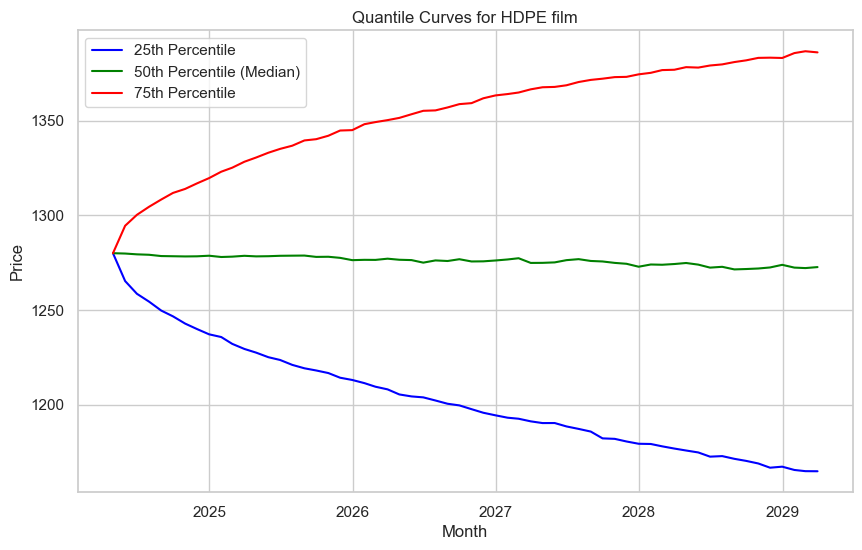

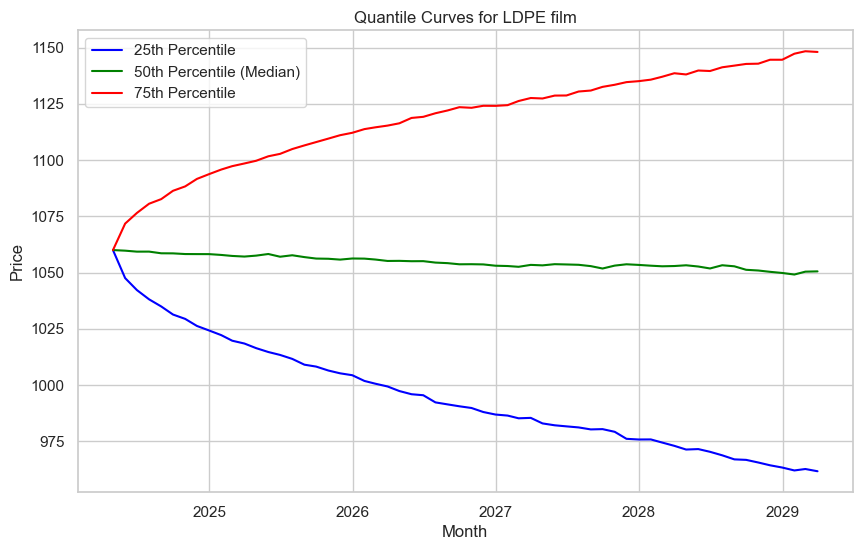

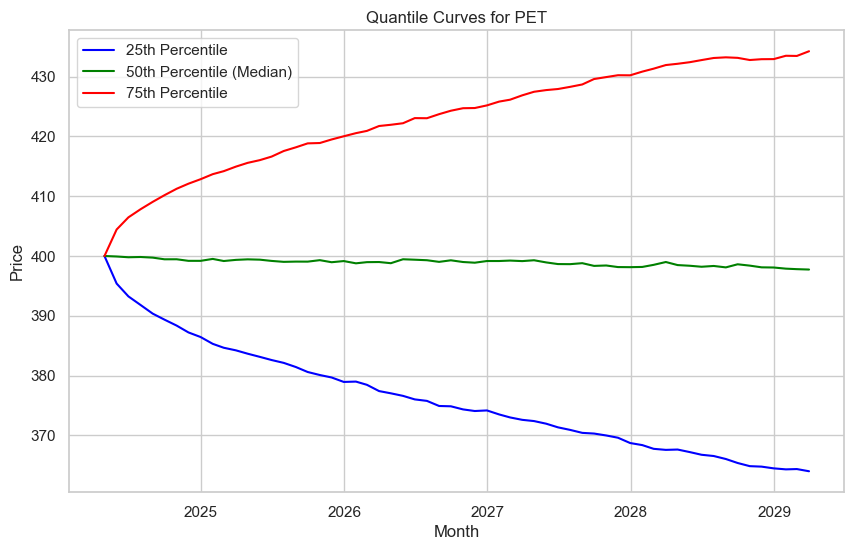

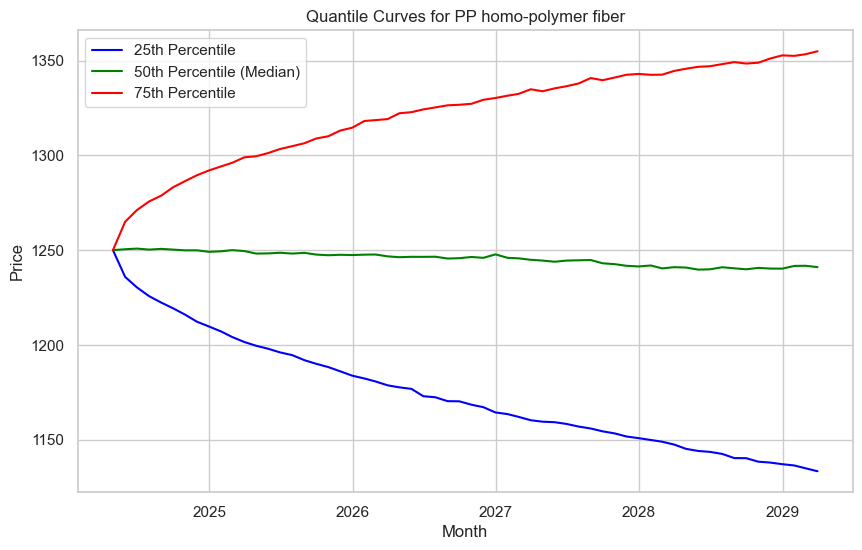

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import norm

# Set the aesthetic parameters
sns.set(style="whitegrid")

# Define the data
data = {
    'Month': ['Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 'Dec-19',
              'Jan-20', 'Feb-20', 'Mar-20', 'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20',
              'Oct-20', 'Nov-20', 'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21', 'Jun-21',
              'Jul-21', 'Aug-21', 'Sep-21', 'Oct-21', 'Nov-21', 'Dec-21', 'Jan-22', 'Feb-22', 'Mar-22',
              'Apr-22', 'May-22', 'Jun-22', 'Jul-22', 'Aug-22', 'Sep-22', 'Oct-22', 'Nov-22', 'Dec-22',
              'Jan-23', 'Feb-23', 'Mar-23', 'Apr-23', 'May-23', 'Jun-23', 'Jul-23', 'Aug-23', 'Sep-23',
              'Oct-23', 'Nov-23', 'Dec-23', 'Jan-24', 'Feb-24', 'Mar-24'],
    'HDPE film': [1166, 1182, 1166, 1102, 1074, 1027, 1037, 988, 967, 958, 958, 819, 817, 757, 809, 878,
                  914, 911, 882, 948, 958, 1140, 1435, 1744, 1858, 1523, 1465, 1350, 1354, 1413, 1388,
                  1595, 1553, 1543, 1547, 1762, 1968, 1729, 1708, 1577, 1443, 1355, 1388, 1393, 1339,
                  1313, 1299, 1334, 1229, 1122, 1065, 1016, 1118, 1158, 1175, 1076, 1063, 1186, 1265, 1280],
    'LDPE film': [1096, 1120, 1105, 1047, 1029, 964, 985, 953, 952, 944, 953, 836, 828, 762, 840, 917,
                  935, 918, 912, 1024, 1051, 1288, 1562, 1920, 2082, 1900, 1816, 1710, 1748, 1767, 1486,
                  1914, 1872, 1851, 1845, 2033, 2225, 1932, 1893, 1660, 1547, 1407, 1486, 1431, 1394,
                  1352, 1330, 1349, 1261, 1095, 979, 986, 1090, 1162, 1221, 1067, 1059, 1290, 1351, 1060],
    'PET': [170, 200, 200, 180, 200, 160, 190, 150, 210, 130, 170, 230, 220, 210, 140, 220, 160, 90, 70,
            180, 300, 160, 100, 80, 140, 70, 70, 200, 160, 180, 290, 90, 70, 0, 360, 200, 140, 250, 10,
            90, 360, 450, 400, 400, 410, 470, 340, 220, 230, 310, 300, 310, 300, 250, 320, 190, 200, 260, 260, 400],
    'PP homo-polymer fiber': [1203, 1223, 1197, 1070, 1055, 1008, 1019, 979, 995, 968, 977, 917, 917,
                              847, 893, 938, 949, 936, 921, 997, 1012, 1194, 1434, 1844, 2066, 1962,
                              1630, 1538, 1631, 1631, 1275, 1712, 1697, 1676, 1654, 1860, 2043, 1790,
                              1648, 1466, 1248, 1191, 1275, 1265, 1220, 1227, 1250, 1275, 1221, 1121,
                              1062, 1019, 1065, 1141, 1145, 1057, 1029, 1237, 1254, 1250],
}

# Create DataFrame from the data dictionary
df = pd.DataFrame(data)
df['Month'] = pd.to_datetime(df['Month'], format='%b-%y')  # Corrected date format
df.set_index('Month', inplace=True)

# Data Preprocessing: Identify and treat outliers using the IQR method
def treat_outliers_iqr(df):
    for column in df.columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
        df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])
    return df

# Treat outliers in the DataFrame
df = treat_outliers_iqr(df)

# Interest rate for forward contracts
interest_rate = 0.0244  # 2.44%

# Delivery period for forward contracts
delivery_period = (3, 30)  # 3-30 days

# Define parameters and initialize variables for simulations
num_scenarios = 10000  # Number of scenarios for Monte Carlo simulation
n_months_future = 60  # Simulate future prices for the next 5 years (12 months * 5 years)
dt = 1 / 252  # Assuming daily data; adjust as needed

# Function to perform Monte Carlo simulation with specified parameters
def monte_carlo_simulation(s0, mu, sigma, n, num_scenarios, dt):
    prices = np.zeros((num_scenarios, n))
    for i in range(num_scenarios):
        price = np.zeros(n)
        price[0] = s0
        for t in range(1, n):
            simulated_return = (mu - 0.5 * sigma**2) * dt + sigma * np.sqrt(dt) * np.random.normal()
            next_price = price[t - 1] * np.exp(simulated_return)
            if next_price <= 0:
                prices[i, t:] = np.nan
                break
            price[t] = next_price
        prices[i, :t+1] = price[:t+1]
    return prices

# Adjust the start date for simulation to April 2024
start_date_future = pd.Timestamp('2024-04-01')

# Initialize simulated prices dictionary
simulated_prices_future = {}

# Loop over each polymer compound and perform simulation
for material in ['HDPE film', 'LDPE film', 'PET', 'PP homo-polymer fiber']:
    # Simulate future prices with specified parameters starting from April 2024
    s0_future = df[material].iloc[-1]
    mu = 0.003  # Drift (mu) of 0.3%
    sigma = 0.27124  # Volatility (sigma) of 27.12%
    simulated_prices = monte_carlo_simulation(s0_future, mu, sigma, n_months_future, num_scenarios, dt)
    simulated_prices_future[material] = simulated_prices

    # Calculate quantiles for each month
    quantiles = np.percentile(simulated_prices, [25, 50, 75], axis=0)

    # Plot quantile curves
    plt.figure(figsize=(10, 6))
    months = pd.date_range(start=start_date_future, periods=n_months_future, freq='M')
    plt.plot(months, quantiles[0], color='blue', label='25th Percentile')
    plt.plot(months, quantiles[1], color='green', label='50th Percentile (Median)')
    plt.plot(months, quantiles[2], color='red', label='75th Percentile')
    plt.title(f'Quantile Curves for {material}')
    plt.xlabel('Month')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

**Python Code for Time Series XGBoost Forecasting model**

Forecasted prices for HDPE film from 2024-04-30 00:00:00 to 2029-03-31 00:00:00:
              HDPE film
2024-04-30  1274.308105
2024-05-31  1257.547363
2024-06-30  1159.683838
2024-07-31  1062.042480
2024-08-31  1227.966675
2024-09-30  1200.561035
2024-10-31  1145.120850
2024-11-30  1136.769409
2024-12-31  1057.913818
2025-01-31  1073.662231
2025-02-28  1257.484619
2025-03-31  1252.285645
2025-04-30  1254.674805
2025-05-31  1235.835571
2025-06-30  1243.593262
2025-07-31  1076.340942
2025-08-31  1244.168579
2025-09-30  1243.324097
2025-10-31  1228.490845
2025-11-30  1136.134521
2025-12-31  1135.400269
2026-01-31  1068.430542
2026-02-28  1243.768066
2026-03-31  1243.482178
2026-04-30  1243.081665
2026-05-31  1243.711304
2026-06-30  1251.007812
2026-07-31  1071.635010
2026-08-31  1246.557739
2026-09-30  1243.324097
2026-10-31  1241.036133
2026-11-30  1061.984863
2026-12-31  1136.507446
2027-01-31  1068.430542
2027-02-28  1243.768066
2027-03-31  1243.324097
2027-04-30  1243.081665
2027-05

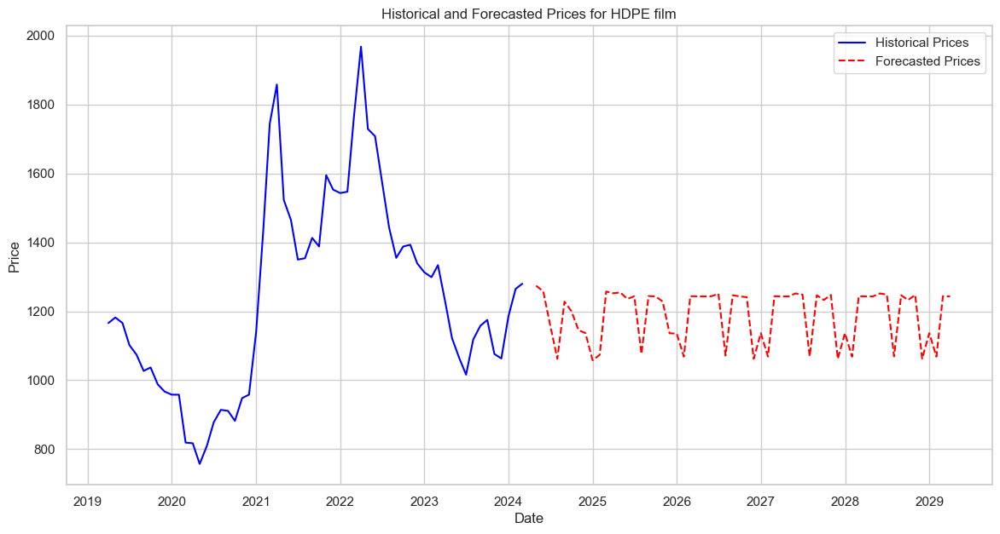


Error Metrics for HDPE film:
Mean Squared Error (MSE): 50340.01
Mean Absolute Error (MAE): 179.78
Root Mean Squared Error (RMSE): 224.37
Mean Absolute Percentage Error (MAPE): 11.70%
Forecasted prices for LDPE film from 2024-04-30 00:00:00 to 2029-03-31 00:00:00:
              LDPE film
2024-04-30  1078.093750
2024-05-31  1348.411377
2024-06-30  1278.071899
2024-07-31  1039.371216
2024-08-31  1168.216431
2024-09-30  1211.995483
2024-10-31  1119.062866
2024-11-30   919.838501
2024-12-31   970.952820
2025-01-31  1046.305908
2025-02-28  1157.451416
2025-03-31  1154.493286
2025-04-30   956.423218
2025-05-31  1261.229370
2025-06-30  1361.444336
2025-07-31   958.028442
2025-08-31  1091.993164
2025-09-30  1172.017212
2025-10-31  1232.316162
2025-11-30   890.706665
2025-12-31   973.646790
2026-01-31  1015.308655
2026-02-28  1075.219116
2026-03-31  1043.350342
2026-04-30   856.331726
2026-05-31  1179.907959
2026-06-30  1520.993896
2026-07-31   892.863953
2026-08-31   989.539246
2026-09-30  122

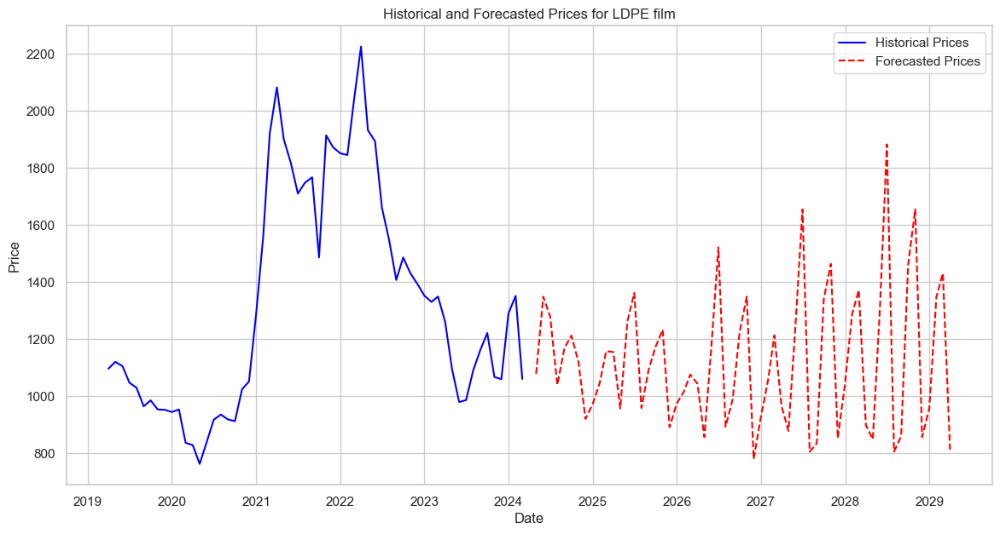


Error Metrics for LDPE film:
Mean Squared Error (MSE): 44288.87
Mean Absolute Error (MAE): 162.04
Root Mean Squared Error (RMSE): 210.45
Mean Absolute Percentage Error (MAPE): 9.79%
Forecasted prices for PET from 2024-04-30 00:00:00 to 2029-03-31 00:00:00:
                   PET
2024-04-30  394.919067
2024-05-31  260.009094
2024-06-30  259.782837
2024-07-31  200.710495
2024-08-31  319.145416
2024-09-30  280.581635
2024-10-31  280.553162
2024-11-30  318.333008
2024-12-31  300.987091
2025-01-31  320.798431
2025-02-28  304.942444
2025-03-31  273.162323
2025-04-30  452.530090
2025-05-31  320.018188
2025-06-30  336.034271
2025-07-31  212.056885
2025-08-31  341.918396
2025-09-30  306.356323
2025-10-31  326.383087
2025-11-30  311.434326
2025-12-31  293.596893
2026-01-31  324.184906
2026-02-28  336.320068
2026-03-31  333.222229
2026-04-30  411.486053
2026-05-31  326.508942
2026-06-30  357.096710
2026-07-31  203.946869
2026-08-31  330.402130
2026-09-30  283.143555
2026-10-31  324.887512
2026-1

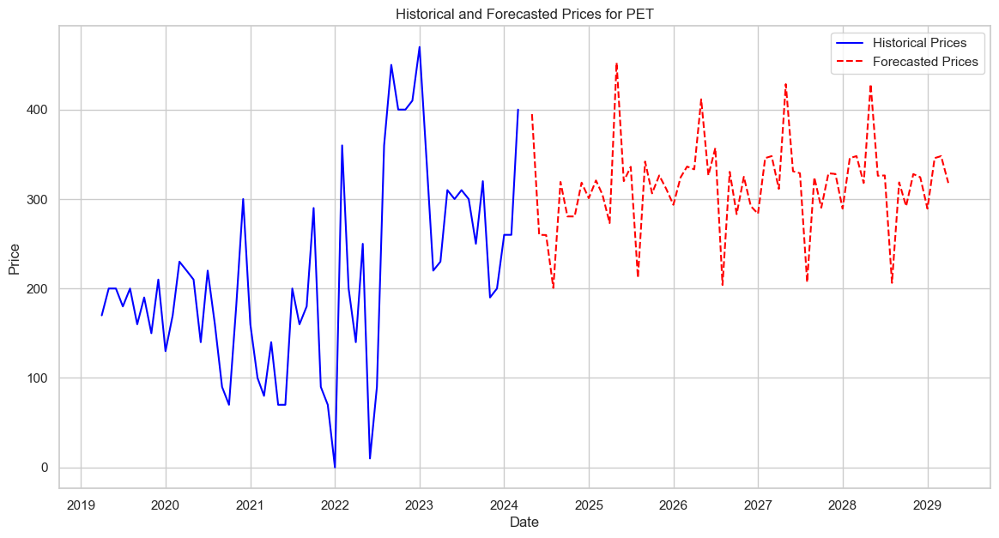


Error Metrics for PET:
Mean Squared Error (MSE): 13713.14
Mean Absolute Error (MAE): 86.59
Root Mean Squared Error (RMSE): 117.10
Mean Absolute Percentage Error (MAPE): 271.10%
Forecasted prices for PP homo-polymer fiber from 2024-04-30 00:00:00 to 2029-03-31 00:00:00:
            PP homo-polymer fiber
2024-04-30            1246.212036
2024-05-31            1256.778198
2024-06-30            1207.233032
2024-07-31            1054.635010
2024-08-31            1116.397827
2024-09-30            1125.024048
2024-10-31            1045.584595
2024-11-30            1050.535400
2024-12-31            1047.493408
2025-01-31            1059.346191
2025-02-28            1264.596924
2025-03-31            1234.713501
2025-04-30            1241.422241
2025-05-31            1284.923706
2025-06-30            1277.294067
2025-07-31            1103.672241
2025-08-31            1199.801270
2025-09-30            1138.464844
2025-10-31            1039.770264
2025-11-30            1044.172974
2025-12-31     

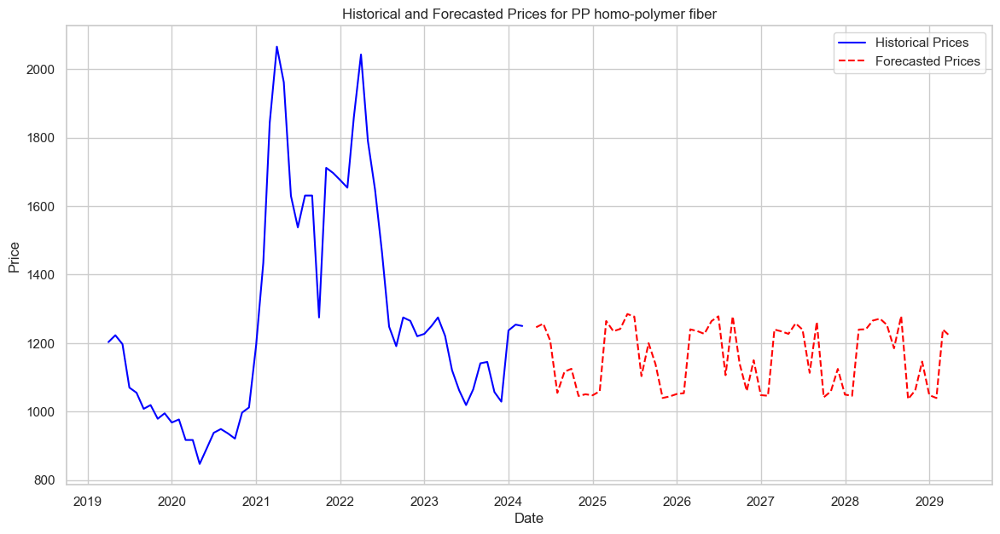


Error Metrics for PP homo-polymer fiber:
Mean Squared Error (MSE): 35435.73
Mean Absolute Error (MAE): 130.66
Root Mean Squared Error (RMSE): 188.24
Mean Absolute Percentage Error (MAPE): 8.48%
Forecasted prices for rPET from 2024-04-30 00:00:00 to 2029-03-31 00:00:00:
                  rPET
2024-04-30  408.189484
2024-05-31  424.979675
2024-06-30  383.967651
2024-07-31  424.634369
2024-08-31  463.083710
2024-09-30  572.250366
2024-10-31  463.557007
2024-11-30  430.959656
2024-12-31  462.088898
2025-01-31  502.290192
2025-02-28  456.639954
2025-03-31  407.817474
2025-04-30  425.076111
2025-05-31  460.838562
2025-06-30  378.909973
2025-07-31  447.736328
2025-08-31  531.969788
2025-09-30  385.076752
2025-10-31  415.778168
2025-11-30  424.958618
2025-12-31  554.195923
2026-01-31  416.068451
2026-02-28  390.431549
2026-03-31  457.154541
2026-04-30  404.248962
2026-05-31  399.763794
2026-06-30  418.839111
2026-07-31  489.917572
2026-08-31  387.429260
2026-09-30  382.204437
2026-10-31  397.

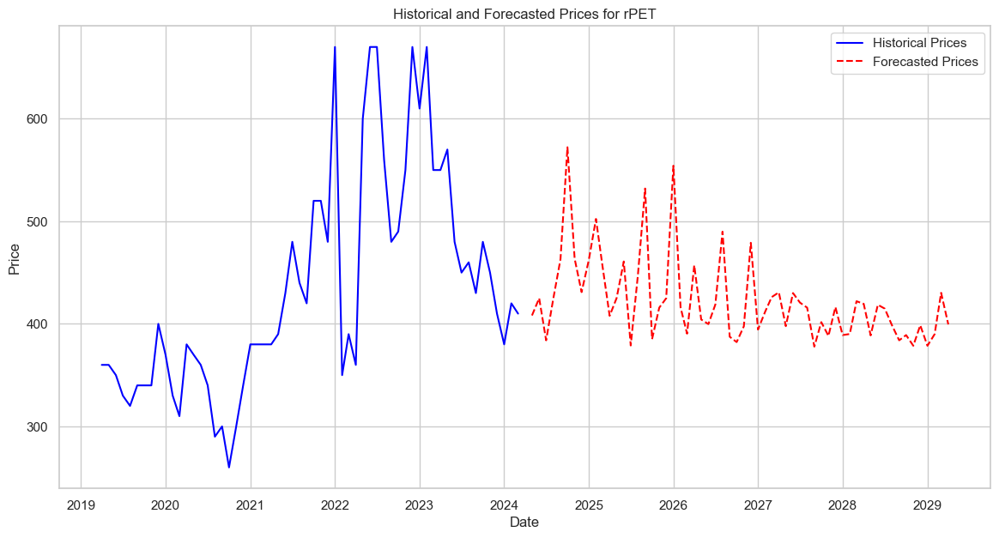


Error Metrics for rPET:
Mean Squared Error (MSE): 12655.87
Mean Absolute Error (MAE): 90.74
Root Mean Squared Error (RMSE): 112.50
Mean Absolute Percentage Error (MAPE): 18.56%
Forecasted prices for rLDPE Film from 2024-04-30 00:00:00 to 2029-03-31 00:00:00:
            rLDPE Film
2024-04-30  470.068146
2024-05-31  549.340515
2024-06-30  559.600281
2024-07-31  423.662994
2024-08-31  419.414398
2024-09-30  353.122559
2024-10-31  368.714722
2024-11-30  446.427521
2024-12-31  389.662292
2025-01-31  575.871277
2025-02-28  433.730835
2025-03-31  383.888519
2025-04-30  553.554810
2025-05-31  555.770569
2025-06-30  558.854248
2025-07-31  434.091248
2025-08-31  451.422180
2025-09-30  378.160645
2025-10-31  426.937592
2025-11-30  495.333099
2025-12-31  409.702515
2026-01-31  514.240295
2026-02-28  431.588776
2026-03-31  360.356079
2026-04-30  577.575623
2026-05-31  538.585999
2026-06-30  573.076050
2026-07-31  449.762421
2026-08-31  470.834564
2026-09-30  411.789673
2026-10-31  413.988953
2026

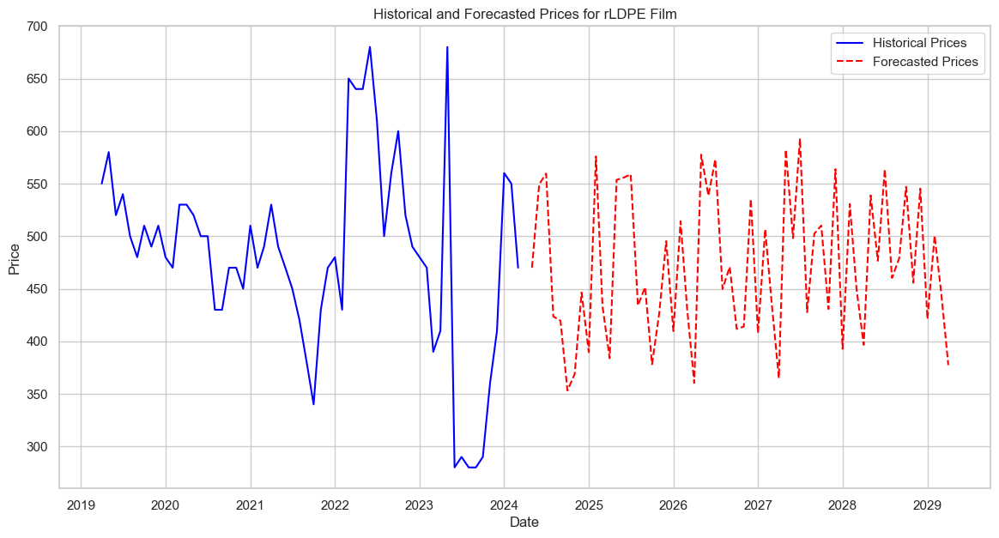


Error Metrics for rLDPE Film:
Mean Squared Error (MSE): 14121.25
Mean Absolute Error (MAE): 91.11
Root Mean Squared Error (RMSE): 118.83
Mean Absolute Percentage Error (MAPE): 17.29%
Forecasted prices for rPP from 2024-04-30 00:00:00 to 2029-03-31 00:00:00:
                   rPP
2024-04-30  724.093689
2024-05-31  660.025635
2024-06-30  641.812683
2024-07-31  614.689148
2024-08-31  733.644714
2024-09-30  799.050842
2024-10-31  724.746033
2024-11-30  808.271423
2024-12-31  721.389648
2025-01-31  801.367615
2025-02-28  617.885925
2025-03-31  623.163940
2025-04-30  656.462830
2025-05-31  772.062622
2025-06-30  733.428650
2025-07-31  810.632935
2025-08-31  756.861572
2025-09-30  771.984741
2025-10-31  735.249207
2025-11-30  661.367493
2025-12-31  681.590637
2026-01-31  662.774414
2026-02-28  752.620117
2026-03-31  785.523010
2026-04-30  738.140076
2026-05-31  829.554504
2026-06-30  738.040955
2026-07-31  816.567444
2026-08-31  630.811523
2026-09-30  759.985901
2026-10-31  639.733765
2026-

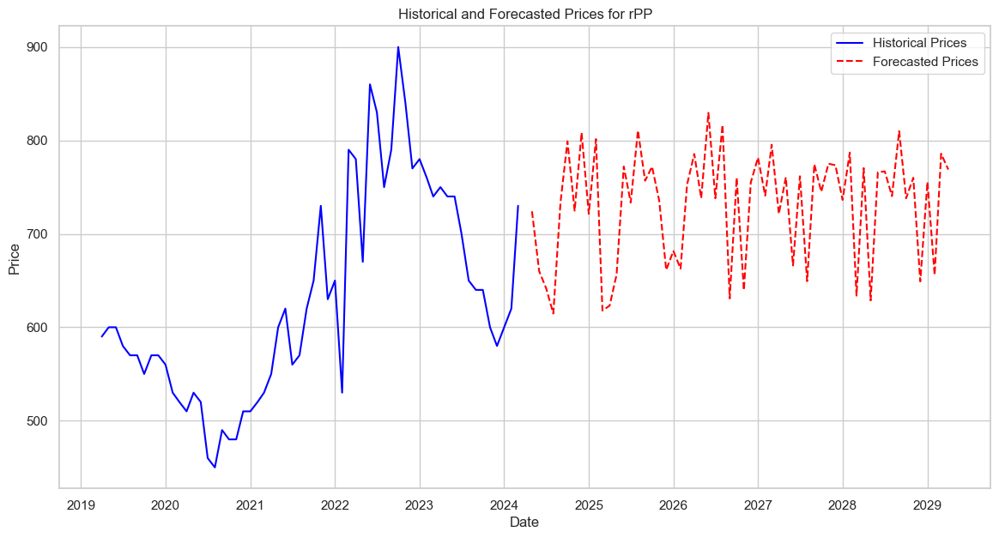


Error Metrics for rPP:
Mean Squared Error (MSE): 7794.24
Mean Absolute Error (MAE): 69.97
Root Mean Squared Error (RMSE): 88.28
Mean Absolute Percentage Error (MAPE): 10.12%
Forecasted prices for rHDPE Film from 2024-04-30 00:00:00 to 2029-03-31 00:00:00:
            rHDPE Film
2024-04-30  520.186462
2024-05-31  569.058960
2024-06-30  587.328430
2024-07-31  614.878235
2024-08-31  693.768677
2024-09-30  678.473145
2024-10-31  652.605225
2024-11-30  739.518188
2024-12-31  615.961975
2025-01-31  645.812683
2025-02-28  696.726257
2025-03-31  622.827393
2025-04-30  535.507202
2025-05-31  546.903259
2025-06-30  597.828186
2025-07-31  760.422485
2025-08-31  689.126099
2025-09-30  653.006653
2025-10-31  721.911133
2025-11-30  602.541626
2025-12-31  613.896912
2026-01-31  691.815491
2026-02-28  625.484863
2026-03-31  680.123962
2026-04-30  544.516113
2026-05-31  536.696228
2026-06-30  747.423096
2026-07-31  691.223389
2026-08-31  635.480530
2026-09-30  737.119019
2026-10-31  592.639282
2026-11

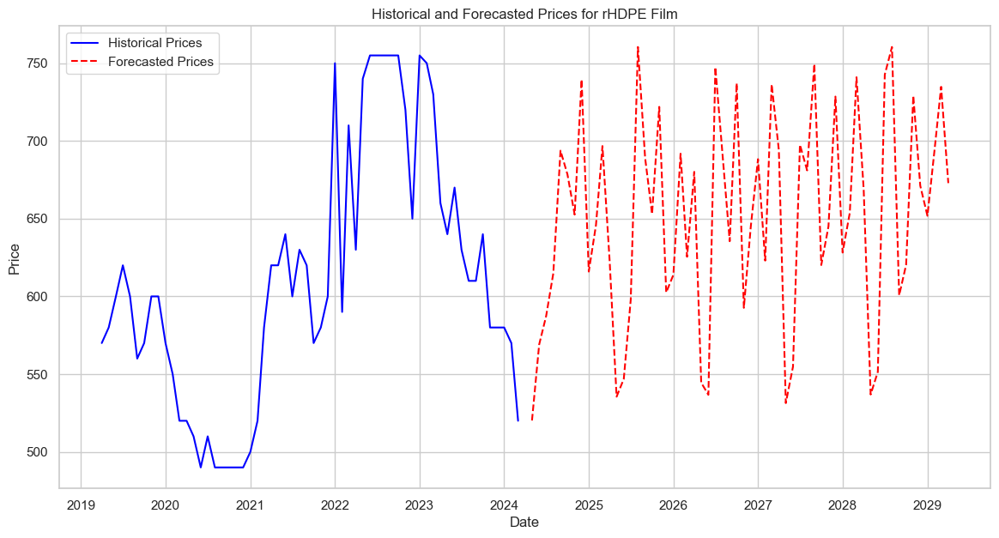


Error Metrics for rHDPE Film:
Mean Squared Error (MSE): 2703.86
Mean Absolute Error (MAE): 42.75
Root Mean Squared Error (RMSE): 52.00
Mean Absolute Percentage Error (MAPE): 6.60%


In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Set the aesthetic parameters in one step
sns.set(style="whitegrid")

# Define the data
data = {
    'Month': ['Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 'Dec-19',
              'Jan-20', 'Feb-20', 'Mar-20', 'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20',
              'Oct-20', 'Nov-20', 'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21', 'Jun-21',
              'Jul-21', 'Aug-21', 'Sep-21', 'Oct-21', 'Nov-21', 'Dec-21', 'Jan-22', 'Feb-22', 'Mar-22',
              'Apr-22', 'May-22', 'Jun-22', 'Jul-22', 'Aug-22', 'Sep-22', 'Oct-22', 'Nov-22', 'Dec-22',
              'Jan-23', 'Feb-23', 'Mar-23', 'Apr-23', 'May-23', 'Jun-23', 'Jul-23', 'Aug-23', 'Sep-23',
              'Oct-23', 'Nov-23', 'Dec-23', 'Jan-24', 'Feb-24', 'Mar-24'],
    'HDPE film': [1166, 1182, 1166, 1102, 1074, 1027, 1037, 988, 967, 958, 958, 819, 817, 757, 809, 878,
                  914, 911, 882, 948, 958, 1140, 1435, 1744, 1858, 1523, 1465, 1350, 1354, 1413, 1388,
                  1595, 1553, 1543, 1547, 1762, 1968, 1729, 1708, 1577, 1443, 1355, 1388, 1393, 1339,
                  1313, 1299, 1334, 1229, 1122, 1065, 1016, 1118, 1158, 1175, 1076, 1063, 1186, 1265, 1280],
    'LDPE film': [1096, 1120, 1105, 1047, 1029, 964, 985, 953, 952, 944, 953, 836, 828, 762, 840, 917,
                  935, 918, 912, 1024, 1051, 1288, 1562, 1920, 2082, 1900, 1816, 1710, 1748, 1767, 1486,
                  1914, 1872, 1851, 1845, 2033, 2225, 1932, 1893, 1660, 1547, 1407, 1486, 1431, 1394,
                  1352, 1330, 1349, 1261, 1095, 979, 986, 1090, 1162, 1221, 1067, 1059, 1290, 1351, 1060],
    'PET': [170, 200, 200, 180, 200, 160, 190, 150, 210, 130, 170, 230, 220, 210, 140, 220, 160, 90, 70,
            180, 300, 160, 100, 80, 140, 70, 70, 200, 160, 180, 290, 90, 70, 0, 360, 200, 140, 250, 10,
            90, 360, 450, 400, 400, 410, 470, 340, 220, 230, 310, 300, 310, 300, 250, 320, 190, 200, 260, 260, 400],
    'PP homo-polymer fiber': [1203, 1223, 1197, 1070, 1055, 1008, 1019, 979, 995, 968, 977, 917, 917,
                              847, 893, 938, 949, 936, 921, 997, 1012, 1194, 1434, 1844, 2066, 1962,
                              1630, 1538, 1631, 1631, 1275, 1712, 1697, 1676, 1654, 1860, 2043, 1790,
                              1648, 1466, 1248, 1191, 1275, 1265, 1220, 1227, 1250, 1275, 1221, 1121,
                              1062, 1019, 1065, 1141, 1145, 1057, 1029, 1237, 1254, 1250],
    'rPET': [360, 360, 350, 330, 320, 340, 340, 340, 400, 370, 330, 310, 380, 370, 360, 340, 290, 300, 260, 300, 340, 380, 380, 380, 380, 390, 430, 480, 440, 420, 520, 520, 480, 720, 350, 390, 360, 600, 820, 720, 560, 480, 490, 550, 700, 610, 700, 550, 550, 570, 480, 450, 460, 430, 480, 450, 410, 380, 420, 410],
    'rLDPE Film': [550, 580, 520, 540, 500, 480, 510, 490, 510, 480, 470, 530, 530, 520, 500, 500, 430, 430, 470, 470, 450, 510, 470, 490, 530, 490, 470, 450, 420, 380, 340, 430, 470, 480, 430, 650, 640, 640, 790, 610, 500, 560, 600, 520, 490, 480, 470, 390, 410, 730, 180, 290, 180, 180, 290, 360, 410, 560, 550, 470],
    'rPP': [590, 600, 600, 580, 570, 570, 550, 570, 570, 560, 530, 520, 510, 530, 520, 460, 450, 490, 480, 480, 510, 510, 520, 530, 550, 600, 620, 560, 570, 620, 650, 730, 630, 650, 530, 790, 780, 670, 860, 830, 750, 790, 900, 840, 770, 780, 760, 740, 750, 740, 740, 700, 650, 640, 640, 600, 580, 600, 620, 730],
    'rHDPE Film': [570, 580, 600, 620, 600, 560, 570, 600, 600, 570, 550, 520, 520, 510, 490, 510, 490, 490, 490, 490, 490, 500, 520, 580, 620, 620, 640, 600, 630, 620, 570, 580, 600, 750, 590, 710, 630, 740, 1010, 1020, 780, 770, 760, 720, 650, 760, 750, 730, 660, 640, 670, 630, 610, 610, 640, 580, 580, 580, 570, 520]
}

# Create DataFrame from the data dictionary
df = pd.DataFrame(data)
df['Month'] = pd.to_datetime(df['Month'], format='%b-%y')
df.set_index('Month', inplace=True)

# Data Preprocessing: Identify and treat outliers using the IQR method
def treat_outliers_iqr(df):
    for column in df.columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
        df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])
    return df

# Treat outliers in the DataFrame
df = treat_outliers_iqr(df)

# Function to create lag features
def create_lag_features(df, compound_name, n_lags):
    lag_df = pd.DataFrame()
    for lag in range(1, n_lags + 1):
        lag_df[f'lag_{lag}'] = df[compound_name].shift(lag)
    return lag_df.dropna()

# Function to forecast prices using XGBoost
def forecast_prices_xgb(compound_name, forecast_period=60, n_lags=12):
    compound_df = df[[compound_name]].copy()
    n_lags = min(n_lags, len(compound_df) - 1)
    lag_df = create_lag_features(compound_df, compound_name, n_lags)
    y = compound_df[compound_name].iloc[n_lags:]
    X_train, X_test, y_train, y_test = train_test_split(lag_df, y, test_size=0.25, random_state=42)
    
    # Initialize and train the XGBoost model
    reg = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.01, max_depth=3, objective='reg:squarederror', booster='gbtree')
    reg.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], verbose=False)
    
    # Forecast future prices
    future_dates = pd.date_range(start=df.index[-1] + pd.DateOffset(months=1), periods=forecast_period, freq='M')
    future_df = pd.DataFrame(index=future_dates, columns=[compound_name])
    last_known_data = lag_df.iloc[-1:].values.reshape(1, -1)
    forecasted_prices = []
    for _ in future_dates:
        future_price = reg.predict(last_known_data)
        forecasted_prices.append(future_price[0])
        last_known_data = np.roll(last_known_data, -1)
        last_known_data[0, -1] = future_price
    future_df[compound_name] = forecasted_prices
    
    # Print forecasted prices
    print(f"Forecasted prices for {compound_name} from {future_dates[0]} to {future_dates[-1]}:")
    print(future_df)
    
    # Plot historical and forecasted prices
    plt.figure(figsize=(14, 7))
    plt.plot(df.index, df[compound_name], label='Historical Prices', color='blue')
    plt.plot(future_df.index, forecasted_prices, label='Forecasted Prices', color='red', linestyle='--')
    plt.title(f'Historical and Forecasted Prices for {compound_name}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()
    
    # Calculate and print error metrics
    y_pred = reg.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
    print(f"\nError Metrics for {compound_name}:")
    print(f"Mean Squared Error (MSE): {mse:.2f}")
    print(f"Mean Absolute Error (MAE): {mae:.2f}")
    print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
    print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

# Forecast prices for all compounds
for compound in df.columns:
    forecast_prices_xgb(compound, forecast_period=60, n_lags=12)


**Python Code for Decision Trees and Feature Engineering derived from the Time Series XGBoost Forecasting Model**

<Figure size 2000x1000 with 0 Axes>

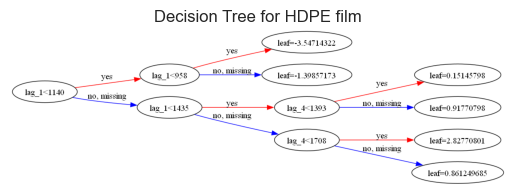

<Figure size 1000x600 with 0 Axes>

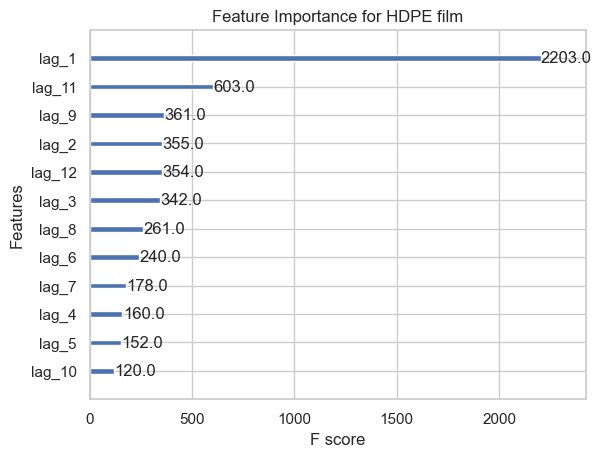

<Figure size 2000x1000 with 0 Axes>

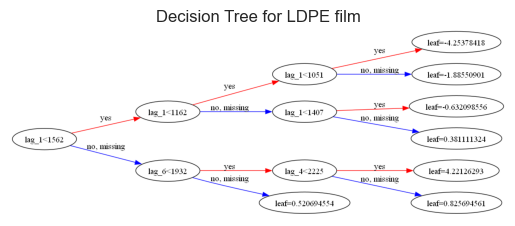

<Figure size 1000x600 with 0 Axes>

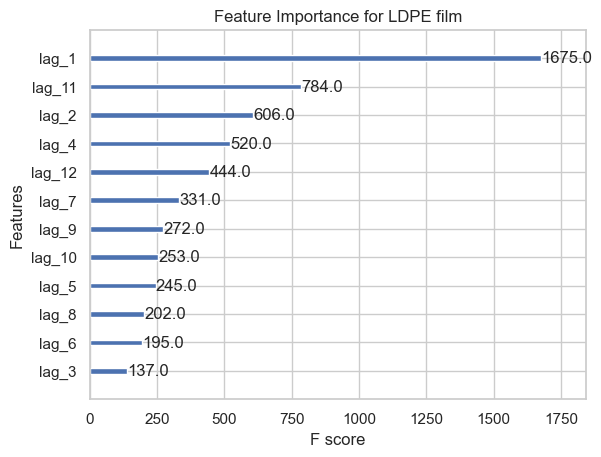

<Figure size 2000x1000 with 0 Axes>

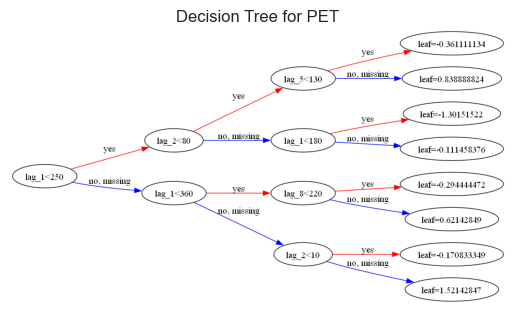

<Figure size 1000x600 with 0 Axes>

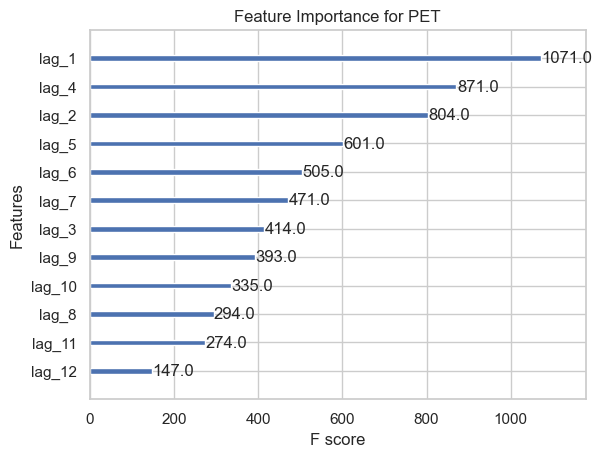

<Figure size 2000x1000 with 0 Axes>

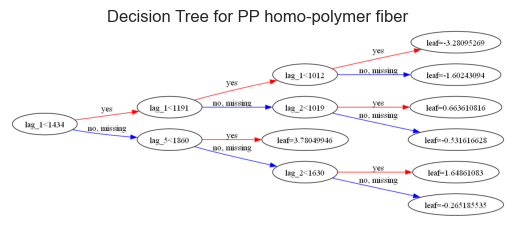

<Figure size 1000x600 with 0 Axes>

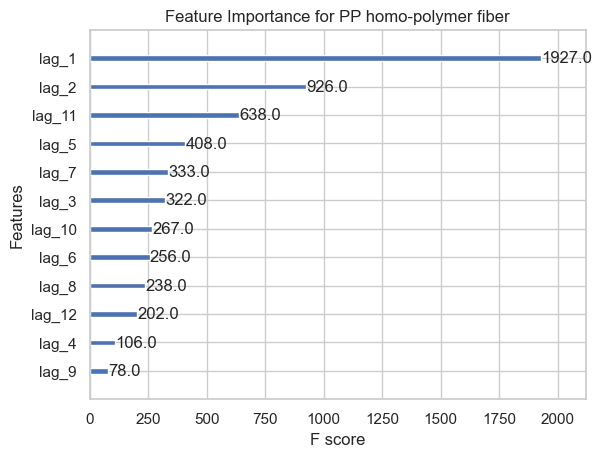

<Figure size 2000x1000 with 0 Axes>

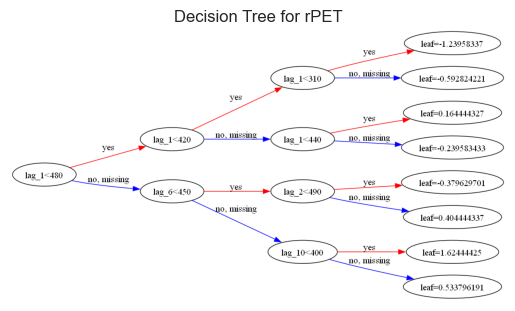

<Figure size 1000x600 with 0 Axes>

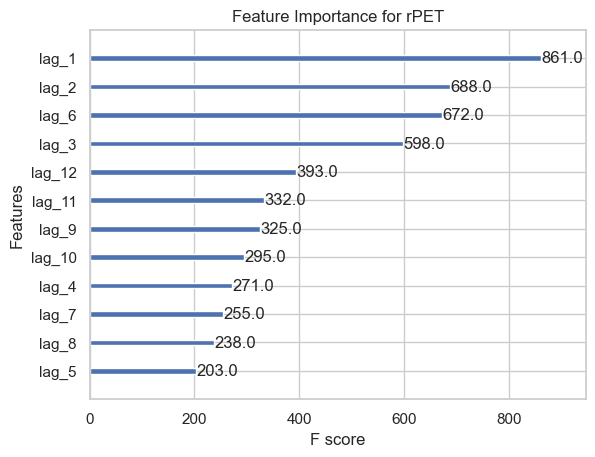

<Figure size 2000x1000 with 0 Axes>

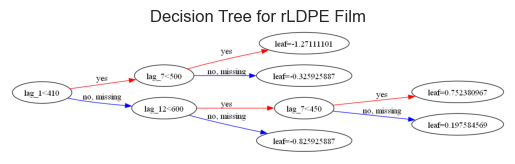

<Figure size 1000x600 with 0 Axes>

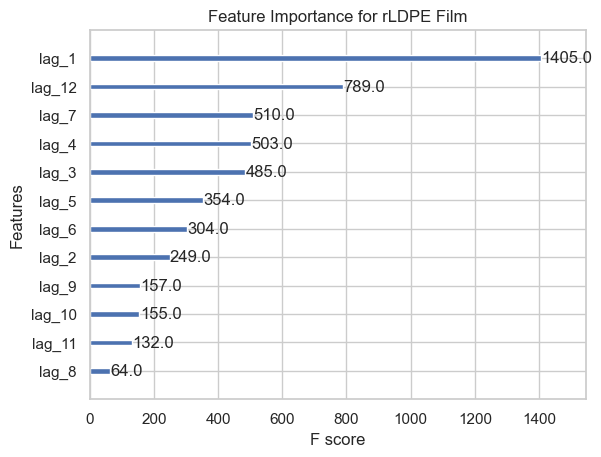

<Figure size 2000x1000 with 0 Axes>

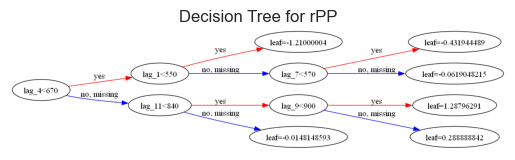

<Figure size 1000x600 with 0 Axes>

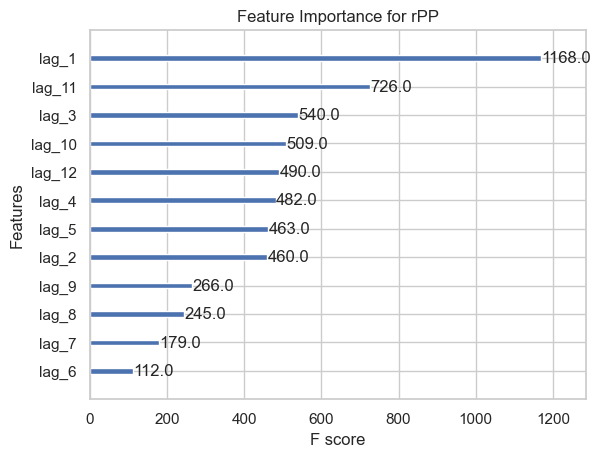

<Figure size 2000x1000 with 0 Axes>

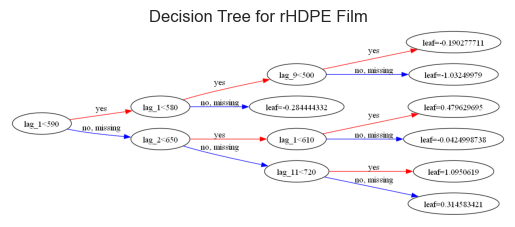

<Figure size 1000x600 with 0 Axes>

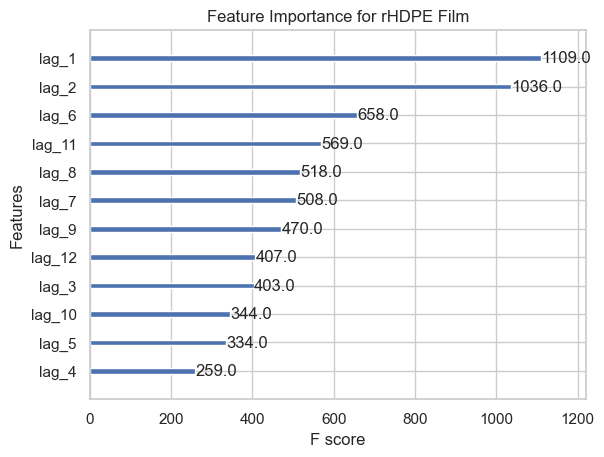

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from xgboost import plot_tree, plot_importance

# Set the aesthetic parameters in one step
sns.set(style="whitegrid")

# Assuming 'data' is the dictionary containing the historical data
data = {
    'Month': ['Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 'Dec-19',
              'Jan-20', 'Feb-20', 'Mar-20', 'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20',
              'Oct-20', 'Nov-20', 'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21', 'Jun-21',
              'Jul-21', 'Aug-21', 'Sep-21', 'Oct-21', 'Nov-21', 'Dec-21', 'Jan-22', 'Feb-22', 'Mar-22',
              'Apr-22', 'May-22', 'Jun-22', 'Jul-22', 'Aug-22', 'Sep-22', 'Oct-22', 'Nov-22', 'Dec-22',
              'Jan-23', 'Feb-23', 'Mar-23', 'Apr-23', 'May-23', 'Jun-23', 'Jul-23', 'Aug-23', 'Sep-23',
              'Oct-23', 'Nov-23', 'Dec-23', 'Jan-24', 'Feb-24', 'Mar-24'],
    'HDPE film': [1166, 1182, 1166, 1102, 1074, 1027, 1037, 988, 967, 958, 958, 819, 817, 757, 809, 878,
                  914, 911, 882, 948, 958, 1140, 1435, 1744, 1858, 1523, 1465, 1350, 1354, 1413, 1388,
                  1595, 1553, 1543, 1547, 1762, 1968, 1729, 1708, 1577, 1443, 1355, 1388, 1393, 1339,
                  1313, 1299, 1334, 1229, 1122, 1065, 1016, 1118, 1158, 1175, 1076, 1063, 1186, 1265, 1280],
    'LDPE film': [1096, 1120, 1105, 1047, 1029, 964, 985, 953, 952, 944, 953, 836, 828, 762, 840, 917,
                  935, 918, 912, 1024, 1051, 1288, 1562, 1920, 2082, 1900, 1816, 1710, 1748, 1767, 1486,
                  1914, 1872, 1851, 1845, 2033, 2225, 1932, 1893, 1660, 1547, 1407, 1486, 1431, 1394,
                  1352, 1330, 1349, 1261, 1095, 979, 986, 1090, 1162, 1221, 1067, 1059, 1290, 1351, 1060],
    'PET': [170, 200, 200, 180, 200, 160, 190, 150, 210, 130, 170, 230, 220, 210, 140, 220, 160, 90, 70,
            180, 300, 160, 100, 80, 140, 70, 70, 200, 160, 180, 290, 90, 70, 0, 360, 200, 140, 250, 10,
            90, 360, 450, 400, 400, 410, 470, 340, 220, 230, 310, 300, 310, 300, 250, 320, 190, 200, 260, 260, 400],
    'PP homo-polymer fiber': [1203, 1223, 1197, 1070, 1055, 1008, 1019, 979, 995, 968, 977, 917, 917,
                              847, 893, 938, 949, 936, 921, 997, 1012, 1194, 1434, 1844, 2066, 1962,
                              1630, 1538, 1631, 1631, 1275, 1712, 1697, 1676, 1654, 1860, 2043, 1790,
                              1648, 1466, 1248, 1191, 1275, 1265, 1220, 1227, 1250, 1275, 1221, 1121,
                              1062, 1019, 1065, 1141, 1145, 1057, 1029, 1237, 1254, 1250],
    'rPET': [360, 360, 350, 330, 320, 340, 340, 340, 400, 370, 330, 310, 380, 370, 360, 340, 290, 300,
             260, 300, 340, 380, 380, 380, 380, 390, 430, 480, 440, 420, 520, 520, 480, 720, 350, 390,
             360, 600, 820, 720, 560, 480, 490, 550, 700, 610, 700, 550, 550, 570, 480, 450, 460, 430,
             480, 450, 410, 380, 420, 410],
    'rLDPE Film': [550, 580, 520, 540, 500, 480, 510, 490, 510, 480, 470, 530, 530, 520, 500, 500, 430,
                   430, 470, 470, 450, 510, 470, 490, 530, 490, 470, 450, 420, 380, 340, 430, 470, 480,
                   430, 650, 640, 640, 790, 610, 500, 560, 600, 520, 490, 480, 470, 390, 410, 730, 180,
                   290, 180, 180, 290, 360, 410, 560, 550, 470],
    'rPP': [590, 600, 600, 580, 570, 570, 550, 570, 570, 560, 530, 520, 510, 530, 520, 460, 450, 490,
            480, 480, 510, 510, 520, 530, 550, 600, 620, 560, 570, 620, 650, 730, 630, 650, 530, 790,
            780, 670, 860, 830, 750, 790, 900, 840, 770, 780, 760, 740, 750, 740, 740, 700, 650, 640,
            640, 600, 580, 600, 620, 730],
    'rHDPE Film': [570, 580, 600, 620, 600, 560, 570, 600, 600, 570, 550, 520, 520, 510, 490, 510, 490,
                   490, 490, 490, 490, 500, 520, 580, 620, 620, 640, 600, 630, 620, 570, 580, 600, 750,
                   590, 710, 630, 740, 1010, 1020, 780, 770, 760, 720, 650, 760, 750, 730, 660, 640,
                   670, 630, 610, 610, 640, 580, 580, 580, 570, 520]
}

# Convert 'Month' column to datetime and set it as index
df = pd.DataFrame(data)
df['Month'] = pd.to_datetime(df['Month'], format='%b-%y')
df.set_index('Month', inplace=True)

# Data Preprocessing: Identify and treat outliers using the IQR method
def treat_outliers_iqr(df):
    for column in df.columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
        df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])
    return df

# Treat outliers in the DataFrame
df = treat_outliers_iqr(df)


def create_lag_features(df, compound_name, n_lags):
    lag_df = pd.DataFrame()
    for lag in range(1, n_lags + 1):
        lag_df[f'lag_{lag}'] = df[compound_name].shift(lag)
    return lag_df.dropna()

def train_xgb_model(compound_name, n_lags=12):
    compound_df = df[[compound_name]].copy()
    n_lags = min(n_lags, len(compound_df) - 1)
    lag_df = create_lag_features(compound_df, compound_name, n_lags)
    y = compound_df[compound_name].iloc[n_lags:]
    X_train, X_test, y_train, y_test = train_test_split(lag_df, y, test_size=0.25, random_state=42)

    # Initialize and train the XGBoost model
    reg = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.01, max_depth=3, objective='reg:squarederror', booster='gbtree')
    reg.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], verbose=False)

    # Plot the first tree
    plt.figure(figsize=(20, 10))
    plot_tree(reg, num_trees=0, rankdir='LR')
    plt.title(f'Decision Tree for {compound_name}')
    plt.show()

    # Plot feature importance
    plt.figure(figsize=(10, 6))
    plot_importance(reg)
    plt.title(f'Feature Importance for {compound_name}')
    plt.show()

    return reg

# Train and visualize the model for all compounds
for compound in df.columns:
    train_xgb_model(compound, n_lags=12)

In [4]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


**Python Code for 2-Dimensional plot for visualization of Forecasted Prices of Polymer Compounds from Monte Carlo Forward Price Simulation**

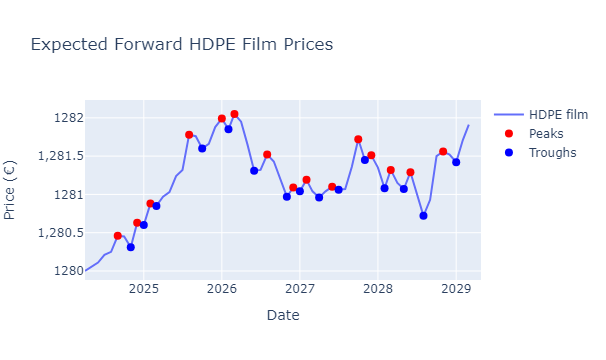

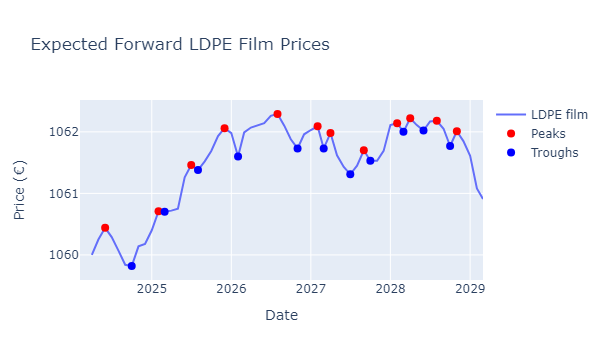

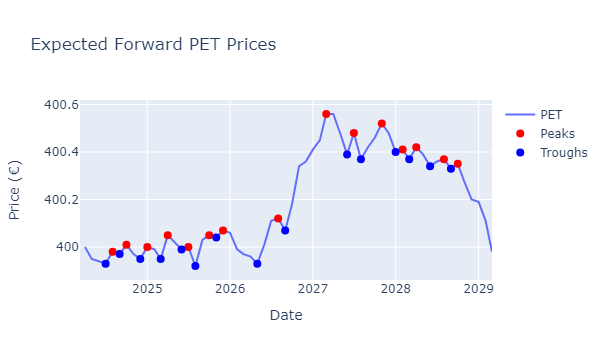

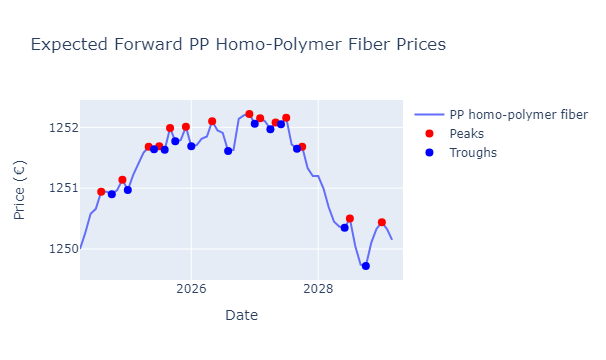

,Month/Year,HDPE film,LDPE film,PET,PP homo-polymer fiber
count,60,60.000000,60.000000,60.000000,60.000000
mean,2026-09-15 23:12:00,1281.173833,1061.467167,400.183000,1251.268500
min,2024-04-01 00:00:00,1280.000000,1059.820000,399.920000,1249.720000
25%,2025-06-23 12:00:00,1280.967500,1061.037500,399.990000,1250.640000
50%,2026-09-16 00:00:00,1281.190000,1061.695000,400.110000,1251.595000
75%,2027-12-08 18:00:00,1281.520000,1062.035000,400.375000,1251.865000
max,2029-03-01 00:00:00,1282.050000,1062.290000,400.560000,1252.220000
std,NaN,0.506888,0.722475,0.208036,0.730662


In [2]:
import pandas as pd
import plotly.graph_objects as go
from scipy.signal import find_peaks

# Data for HDPE film
hdpe_data = {
    "Month/Year": [
        "April 2024", "May 2024", "June 2024", "July 2024", "August 2024", "September 2024", "October 2024", "November 2024", "December 2024",
        "January 2025", "February 2025", "March 2025", "April 2025", "May 2025", "June 2025", "July 2025", "August 2025", "September 2025", "October 2025", "November 2025", "December 2025",
        "January 2026", "February 2026", "March 2026", "April 2026", "May 2026", "June 2026", "July 2026", "August 2026", "September 2026", "October 2026", "November 2026", "December 2026",
        "January 2027", "February 2027", "March 2027", "April 2027", "May 2027", "June 2027", "July 2027", "August 2027", "September 2027", "October 2027", "November 2027", "December 2027",
        "January 2028", "February 2028", "March 2028", "April 2028", "May 2028", "June 2028", "July 2028", "August 2028", "September 2028", "October 2028", "November 2028", "December 2028",
        "January 2029", "February 2029", "March 2029"
    ],
        "HDPE film":[
        1280.00, 1280.05, 1280.11, 1280.21, 1280.25, 1280.46, 1280.45, 1280.31, 1280.63,
        1280.60, 1280.88, 1280.85, 1280.97, 1281.03, 1281.24, 1281.32, 1281.78, 1281.76, 1281.60, 1281.66, 1281.88,
        1281.99, 1281.85, 1282.05, 1281.95, 1281.65, 1281.31, 1281.32, 1281.52, 1281.43, 1281.19, 1280.97, 1281.09,
        1281.04, 1281.19, 1281.04, 1280.96, 1281.04, 1281.10, 1281.06, 1281.07, 1281.36, 1281.72, 1281.45, 1281.51,
        1281.35, 1281.08, 1281.32, 1281.15, 1281.07, 1281.29, 1281.00, 1280.72, 1280.93, 1281.50, 1281.56, 1281.52,
        1281.42, 1281.71, 1281.91
    ],

}

# Data for LDPE film
ldpe_data = {
    "Month/Year": hdpe_data["Month/Year"],
    "LDPE film":[
        1060.00, 1060.25, 1060.44, 1060.29, 1060.07, 1059.84, 1059.82, 1060.14, 1060.18,
        1060.40, 1060.71, 1060.70, 1060.72, 1060.75, 1061.26, 1061.46, 1061.38, 1061.52, 1061.69, 1061.93, 1062.06,
        1061.98, 1061.60, 1061.99, 1062.07, 1062.10, 1062.14, 1062.26, 1062.29, 1062.10, 1061.88, 1061.73, 1061.96,
        1062.03, 1062.09, 1061.73, 1061.98, 1061.62, 1061.43, 1061.31, 1061.45, 1061.70, 1061.53, 1061.53, 1061.69,
        1062.11, 1062.14, 1062.00, 1062.22, 1062.11, 1062.02, 1062.17, 1062.18, 1062.05, 1061.77, 1062.01, 1061.85,
        1061.61, 1061.08, 1060.91
    ],
}

# Data for PET
pet_data = {
    "Month/Year": hdpe_data["Month/Year"],
    "PET":[
        400.00, 399.95, 399.94, 399.93, 399.98, 399.97, 400.01, 399.97, 399.95,
        400.00, 399.99, 399.95, 400.05, 400.02, 399.99, 400.00, 399.92, 400.03, 400.05, 400.04, 400.07,
        400.06, 399.99, 399.97, 399.96, 399.93, 400.01, 400.11, 400.12, 400.07, 400.18, 400.34, 400.36,
        400.41, 400.45, 400.56, 400.56, 400.48, 400.39, 400.48, 400.37, 400.42, 400.46, 400.52, 400.48,
        400.40, 400.41, 400.37, 400.42, 400.39, 400.34, 400.36, 400.37, 400.33, 400.35, 400.27, 400.20,
        400.19, 400.11, 399.98
    ],
               
}

# Data for PP homo-polymer fiber
pp_data = {
    "Month/Year": hdpe_data["Month/Year"],
    "PP homo-polymer fiber":[
        1250.00, 1250.26, 1250.58, 1250.66, 1250.94, 1250.94, 1250.90, 1250.97, 1251.14,
        1250.97, 1251.22, 1251.38, 1251.58, 1251.68, 1251.64, 1251.69, 1251.63, 1251.99, 1251.77, 1251.79, 1252.01,
        1251.69, 1251.71, 1251.81, 1251.85, 1252.10, 1251.95, 1251.91, 1251.61, 1251.63, 1252.14, 1252.20, 1252.22,
        1252.06, 1252.15, 1252.10, 1251.97, 1252.08, 1252.05, 1252.16, 1251.72, 1251.65, 1251.68, 1251.33, 1251.20,
        1251.20, 1250.99, 1250.69, 1250.45, 1250.37, 1250.35, 1250.50, 1250.05, 1249.74, 1249.72, 1250.10, 1250.33,
        1250.44, 1250.32, 1250.15
    ],
}

# Create DataFrames
df_hdpe = pd.DataFrame(hdpe_data)
df_ldpe = pd.DataFrame(ldpe_data)
df_pet = pd.DataFrame(pet_data)
df_pp = pd.DataFrame(pp_data)

# Merge DataFrames on "Month/Year"
df = df_hdpe.merge(df_ldpe, on="Month/Year").merge(df_pet, on="Month/Year").merge(df_pp, on="Month/Year")

# Convert "Month/Year" to datetime
df["Month/Year"] = pd.to_datetime(df["Month/Year"], format="%B %Y")

# Function to plot time series with peaks and troughs
def plot_time_series_with_peaks(df, column, title):
    fig = go.Figure()

    # Add time series line
    fig.add_trace(go.Scatter(x=df["Month/Year"], y=df[column], mode='lines', name=column))

    # Find peaks and troughs
    peaks, _ = find_peaks(df[column])
    troughs, _ = find_peaks(-df[column])

    # Add peaks
    fig.add_trace(go.Scatter(
        x=df["Month/Year"].iloc[peaks],
        y=df[column].iloc[peaks],
        mode='markers',
        marker=dict(color='red', size=8),
        name='Peaks'
    ))

    # Add troughs
    fig.add_trace(go.Scatter(
        x=df["Month/Year"].iloc[troughs],
        y=df[column].iloc[troughs],
        mode='markers',
        marker=dict(color='blue', size=8),
        name='Troughs'
    ))

    # Update layout
    fig.update_layout(
        title=title,
        xaxis_title='Date',
        yaxis_title='Price (€)',
        showlegend=True
    )

    fig.show()

# Plot for each polymer compound
plot_time_series_with_peaks(df, "HDPE film", "Expected Forward HDPE Film Prices")
plot_time_series_with_peaks(df, "LDPE film", "Expected Forward LDPE Film Prices")
plot_time_series_with_peaks(df, "PET", "Expected Forward PET Prices")
plot_time_series_with_peaks(df, "PP homo-polymer fiber", "Expected Forward PP Homo-Polymer Fiber Prices")

df.describe()


**Python Code for ascertaining the Historical Price Volatilities from Historical Data**

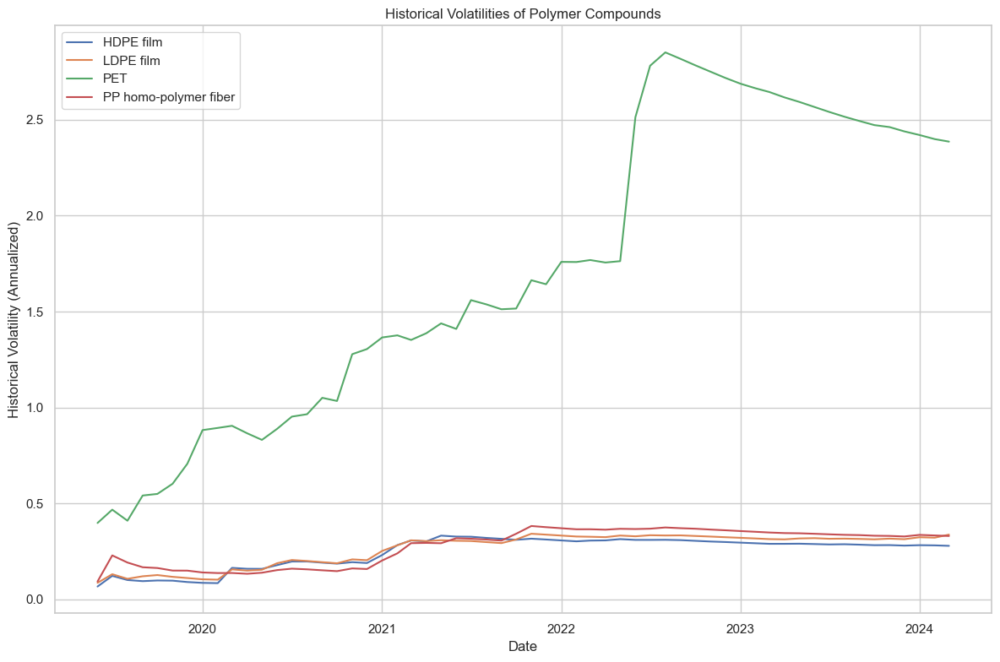

Latest Historical Volatilities:
HDPE film                0.278971
LDPE film                0.337475
PET                      2.386315
PP homo-polymer fiber    0.330219
Name: 2024-03-01 00:00:00, dtype: float64


In [22]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Set the aesthetic parameters
sns.set(style="whitegrid")

# Define the data
data = {
    'Month': ['Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 'Dec-19',
              'Jan-20', 'Feb-20', 'Mar-20', 'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20',
              'Oct-20', 'Nov-20', 'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21', 'Jun-21',
              'Jul-21', 'Aug-21', 'Sep-21', 'Oct-21', 'Nov-21', 'Dec-21', 'Jan-22', 'Feb-22', 'Mar-22',
              'Apr-22', 'May-22', 'Jun-22', 'Jul-22', 'Aug-22', 'Sep-22', 'Oct-22', 'Nov-22', 'Dec-22',
              'Jan-23', 'Feb-23', 'Mar-23', 'Apr-23', 'May-23', 'Jun-23', 'Jul-23', 'Aug-23', 'Sep-23',
              'Oct-23', 'Nov-23', 'Dec-23', 'Jan-24', 'Feb-24', 'Mar-24'],
    'HDPE film': [1166, 1182, 1166, 1102, 1074, 1027, 1037, 988, 967, 958, 958, 819, 817, 757, 809, 878,
                  914, 911, 882, 948, 958, 1140, 1435, 1744, 1858, 1523, 1465, 1350, 1354, 1413, 1388,
                  1595, 1553, 1543, 1547, 1762, 1968, 1729, 1708, 1577, 1443, 1355, 1388, 1393, 1339,
                  1313, 1299, 1334, 1229, 1122, 1065, 1016, 1118, 1158, 1175, 1076, 1063, 1186, 1265, 1280],
    'LDPE film': [1096, 1120, 1105, 1047, 1029, 964, 985, 953, 952, 944, 953, 836, 828, 762, 840, 917,
                  935, 918, 912, 1024, 1051, 1288, 1562, 1920, 2082, 1900, 1816, 1710, 1748, 1767, 1486,
                  1914, 1872, 1851, 1845, 2033, 2225, 1932, 1893, 1660, 1547, 1407, 1486, 1431, 1394,
                  1352, 1330, 1349, 1261, 1095, 979, 986, 1090, 1162, 1221, 1067, 1059, 1290, 1351, 1060],
    'PET': [170, 200, 200, 180, 200, 160, 190, 150, 210, 130, 170, 230, 220, 210, 140, 220, 160, 90, 70,
            180, 300, 160, 100, 80, 140, 70, 70, 200, 160, 180, 290, 90, 70, 0, 360, 200, 140, 250, 10,
            90, 360, 450, 400, 400, 410, 470, 340, 220, 230, 310, 300, 310, 300, 250, 320, 190, 200, 260, 260, 400],
    'PP homo-polymer fiber': [1203, 1223, 1197, 1070, 1055, 1008, 1019, 979, 995, 968, 977, 917, 917,
                              847, 893, 938, 949, 936, 921, 997, 1012, 1194, 1434, 1844, 2066, 1962,
                              1630, 1538, 1631, 1631, 1275, 1712, 1697, 1676, 1654, 1860, 2043, 1790,
                              1648, 1466, 1248, 1191, 1275, 1265, 1220, 1227, 1250, 1275, 1221, 1121,
                              1062, 1019, 1065, 1141, 1145, 1057, 1029, 1237, 1254, 1250],
}

# Create DataFrame from the data dictionary
df = pd.DataFrame(data)
df['Month'] = pd.to_datetime(df['Month'], format='%b-%y')
df.set_index('Month', inplace=True)

# Data Preprocessing: Identify and treat outliers using the IQR method
def treat_outliers_iqr(df):
    for column in df.columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
        df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])
    return df

# Treat outliers in the DataFrame
df = treat_outliers_iqr(df)

# Replace zeros with NaN for interpolation
df = df.replace(0, np.nan)

# Interpolate missing values using linear interpolation
df = df.interpolate(method='linear', limit_direction='both')

# Function to calculate historical volatility
def calculate_historical_volatility(prices):
    log_returns = np.log(prices / prices.shift(1))
    return log_returns.std() * np.sqrt(12)  # Annualize monthly data

# Calculate historical volatilities for each polymer compound
volatilities = pd.DataFrame()
for material in df.columns:
    volatilities[material] = df[material].rolling(window=len(df), min_periods=1).apply(calculate_historical_volatility)

# Plot the historical volatilities
plt.figure(figsize=(12, 8))
for material in volatilities.columns:
    plt.plot(volatilities.index, volatilities[material], label=material)

plt.xlabel('Date')
plt.ylabel('Historical Volatility (Annualized)')
plt.title('Historical Volatilities of Polymer Compounds')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Print the latest volatility values
print("Latest Historical Volatilities:")
print(volatilities.iloc[-1])

**Python Code for Computing the Interquartile Ranges (IQRs) from Historical data**

In [18]:
import pandas as pd
import numpy as np

# Assuming 'data' is the dictionary containing the historical data
data = {
    'Month': ['Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 'Dec-19',
              'Jan-20', 'Feb-20', 'Mar-20', 'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20',
              'Oct-20', 'Nov-20', 'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21', 'Jun-21',
              'Jul-21', 'Aug-21', 'Sep-21', 'Oct-21', 'Nov-21', 'Dec-21', 'Jan-22', 'Feb-22', 'Mar-22',
              'Apr-22', 'May-22', 'Jun-22', 'Jul-22', 'Aug-22', 'Sep-22', 'Oct-22', 'Nov-22', 'Dec-22',
              'Jan-23', 'Feb-23', 'Mar-23', 'Apr-23', 'May-23', 'Jun-23', 'Jul-23', 'Aug-23', 'Sep-23',
              'Oct-23', 'Nov-23', 'Dec-23', 'Jan-24', 'Feb-24', 'Mar-24'],
    'HDPE film': [1166, 1182, 1166, 1102, 1074, 1027, 1037, 988, 967, 958, 958, 819, 817, 757, 809, 878,
                  914, 911, 882, 948, 958, 1140, 1435, 1744, 1858, 1523, 1465, 1350, 1354, 1413, 1388,
                  1595, 1553, 1543, 1547, 1762, 1968, 1729, 1708, 1577, 1443, 1355, 1388, 1393, 1339,
                  1313, 1299, 1334, 1229, 1122, 1065, 1016, 1118, 1158, 1175, 1076, 1063, 1186, 1265, 1280],
    'LDPE film': [1096, 1120, 1105, 1047, 1029, 964, 985, 953, 952, 944, 953, 836, 828, 762, 840, 917,
                  935, 918, 912, 1024, 1051, 1288, 1562, 1920, 2082, 1900, 1816, 1710, 1748, 1767, 1486,
                  1914, 1872, 1851, 1845, 2033, 2225, 1932, 1893, 1660, 1547, 1407, 1486, 1431, 1394,
                  1352, 1330, 1349, 1261, 1095, 979, 986, 1090, 1162, 1221, 1067, 1059, 1290, 1351, 1060],
    'PET': [170, 200, 200, 180, 200, 160, 190, 150, 210, 130, 170, 230, 220, 210, 140, 220, 160, 90, 70,
            180, 300, 160, 100, 80, 140, 70, 70, 200, 160, 180, 290, 90, 70, 0, 360, 200, 140, 250, 10,
            90, 360, 450, 400, 400, 410, 470, 340, 220, 230, 310, 300, 310, 300, 250, 320, 190, 200, 260, 260, 400],
    'PP homo-polymer fiber': [1203, 1223, 1197, 1070, 1055, 1008, 1019, 979, 995, 968, 977, 917, 917,
                              847, 893, 938, 949, 936, 921, 997, 1012, 1194, 1434, 1844, 2066, 1962,
                              1630, 1538, 1631, 1631, 1275, 1712, 1697, 1676, 1654, 1860, 2043, 1790,
                              1648, 1466, 1248, 1191, 1275, 1265, 1220, 1227, 1250, 1275, 1221, 1121,
                              1062, 1019, 1065, 1141, 1145, 1057, 1029, 1237, 1254, 1250],
    'rPET': [360, 360, 350, 330, 320, 340, 340, 340, 400, 370, 330, 310, 380, 370, 360, 340, 290, 300,
             260, 300, 340, 380, 380, 380, 380, 390, 430, 480, 440, 420, 520, 520, 480, 720, 350, 390,
             360, 600, 820, 720, 560, 480, 490, 550, 700, 610, 700, 550, 550, 570, 480, 450, 460, 430,
             480, 450, 410, 380, 420, 410],
    'rLDPE Film': [550, 580, 520, 540, 500, 480, 510, 490, 510, 480, 470, 530, 530, 520, 500, 500, 430,
                   430, 470, 470, 450, 510, 470, 490, 530, 490, 470, 450, 420, 380, 340, 430, 470, 480,
                   430, 650, 640, 640, 790, 610, 500, 560, 600, 520, 490, 480, 470, 390, 410, 730, 180,
                   290, 180, 180, 290, 360, 410, 560, 550, 470],
    'rPP': [590, 600, 600, 580, 570, 570, 550, 570, 570, 560, 530, 520, 510, 530, 520, 460, 450, 490,
            480, 480, 510, 510, 520, 530, 550, 600, 620, 560, 570, 620, 650, 730, 630, 650, 530, 790,
            780, 670, 860, 830, 750, 790, 900, 840, 770, 780, 760, 740, 750, 740, 740, 700, 650, 640,
            640, 600, 580, 600, 620, 730],
    'rHDPE Film': [570, 580, 600, 620, 600, 560, 570, 600, 600, 570, 550, 520, 520, 510, 490, 510, 490,
                   490, 490, 490, 490, 500, 520, 580, 620, 620, 640, 600, 630, 620, 570, 580, 600, 750,
                   590, 710, 630, 740, 1010, 1020, 780, 770, 760, 720, 650, 760, 750, 730, 660, 640,
                   670, 630, 610, 610, 640, 580, 580, 580, 570, 520]
}

# Convert 'Month' column to datetime and set it as index
df = pd.DataFrame(data)
df['Month'] = pd.to_datetime(df['Month'], format='%b-%y')
df.set_index('Month', inplace=True)

# Function to calculate and print IQR and quartile ranges
def calculate_iqr_and_quartiles(df):
    for column in df.columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        print(f"{column}:")
        print(f"  Q1 (25th percentile): {Q1}")
        print(f"  Q3 (75th percentile): {Q3}")
        print(f"  IQR: {IQR}\n")

# Calculate and print IQR and quartile ranges
calculate_iqr_and_quartiles(df)

HDPE film:
  Q1 (25th percentile): 1024.25
  Q3 (75th percentile): 1418.5
  IQR: 394.25

LDPE film:
  Q1 (25th percentile): 985.75
  Q3 (75th percentile): 1672.5
  IQR: 686.75

PET:
  Q1 (25th percentile): 147.5
  Q3 (75th percentile): 292.5
  IQR: 145.0

PP homo-polymer fiber:
  Q1 (25th percentile): 1017.25
  Q3 (75th percentile): 1484.0
  IQR: 466.75

rPET:
  Q1 (25th percentile): 357.5
  Q3 (75th percentile): 482.5
  IQR: 125.0

rLDPE Film:
  Q1 (25th percentile): 430.0
  Q3 (75th percentile): 530.0
  IQR: 100.0

rPP:
  Q1 (25th percentile): 545.0
  Q3 (75th percentile): 732.5
  IQR: 187.5

rHDPE Film:
  Q1 (25th percentile): 567.5
  Q3 (75th percentile): 642.5
  IQR: 75.0



**Python Code for Monte Carlo Simulation Normal Distribution and VaR Backtesting model validation and Expected Violations based on Historical Data**


HDPE film:
VaR Violations: 54
Expected Violations: 2.950000000000003

LDPE film:
VaR Violations: 54
Expected Violations: 2.950000000000003

PET:
VaR Violations: 52
Expected Violations: 2.950000000000003

PP homo-polymer fiber:
VaR Violations: 54
Expected Violations: 2.950000000000003

rPET:
VaR Violations: 53
Expected Violations: 2.950000000000003

rLDPE Film:
VaR Violations: 54
Expected Violations: 2.950000000000003

rPP:
VaR Violations: 55
Expected Violations: 2.950000000000003

rHDPE Film:
VaR Violations: 54
Expected Violations: 2.950000000000003

HDPE film:
Median Price: €1271.12
95% Confidence Interval: €982.89 - €1645.16
Value at Risk (VaR) at 95% confidence: €1022.32
Expected Tail Loss (ETL): €969.16


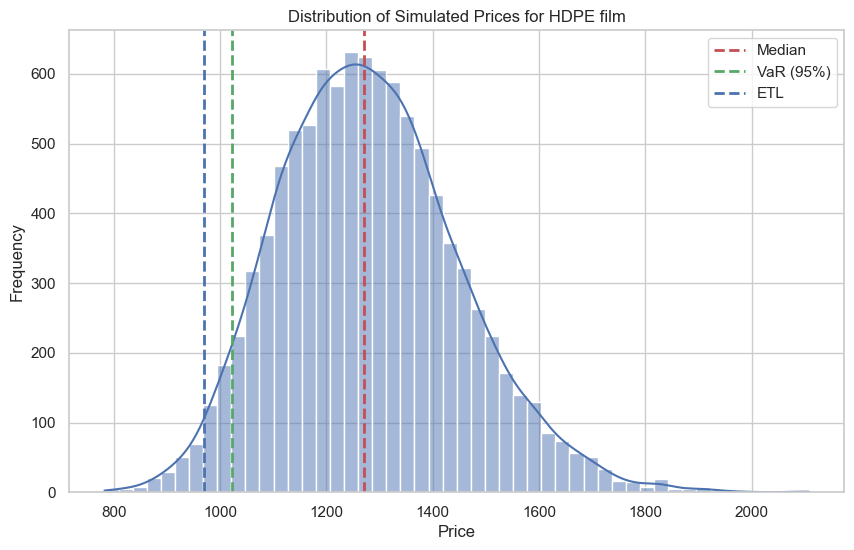


LDPE film:
Median Price: €1053.16
95% Confidence Interval: €811.40 - €1357.67
Value at Risk (VaR) at 95% confidence: €845.82
Expected Tail Loss (ETL): €802.02


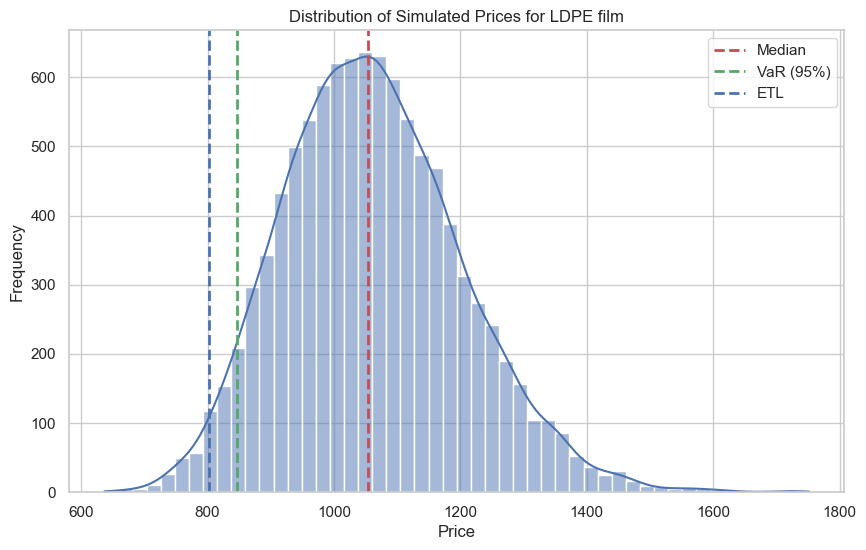


PET:
Median Price: €396.91
95% Confidence Interval: €305.69 - €513.07
Value at Risk (VaR) at 95% confidence: €318.67
Expected Tail Loss (ETL): €301.84


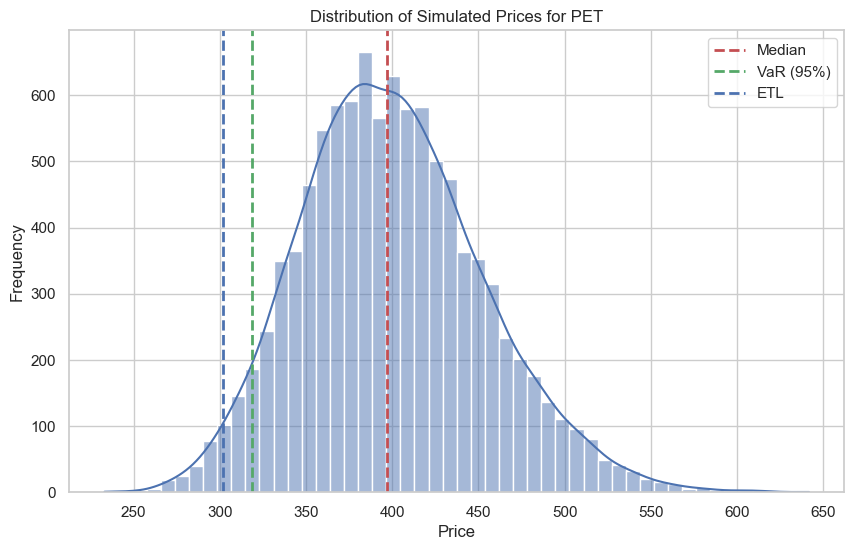


PP homo-polymer fiber:
Median Price: €1241.22
95% Confidence Interval: €955.18 - €1598.48
Value at Risk (VaR) at 95% confidence: €998.64
Expected Tail Loss (ETL): €945.51


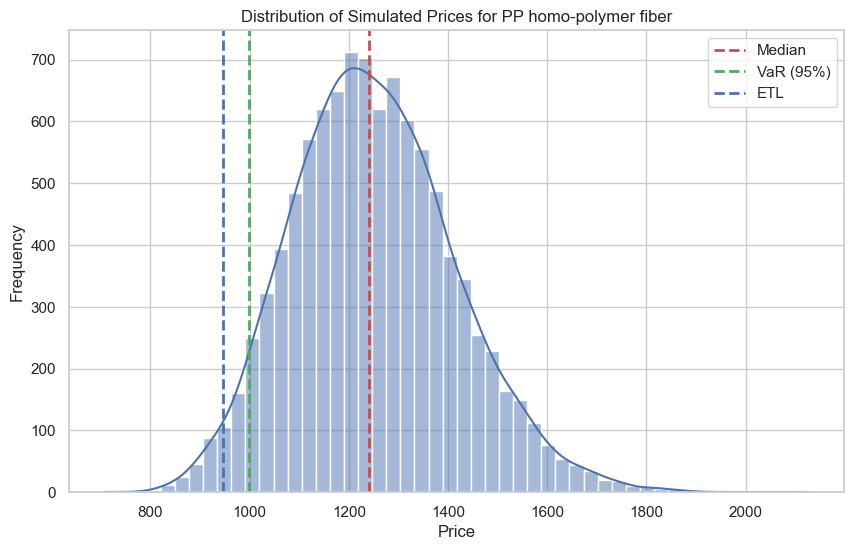


rPET:
Median Price: €407.40
95% Confidence Interval: €313.48 - €526.97
Value at Risk (VaR) at 95% confidence: €328.58
Expected Tail Loss (ETL): €310.51


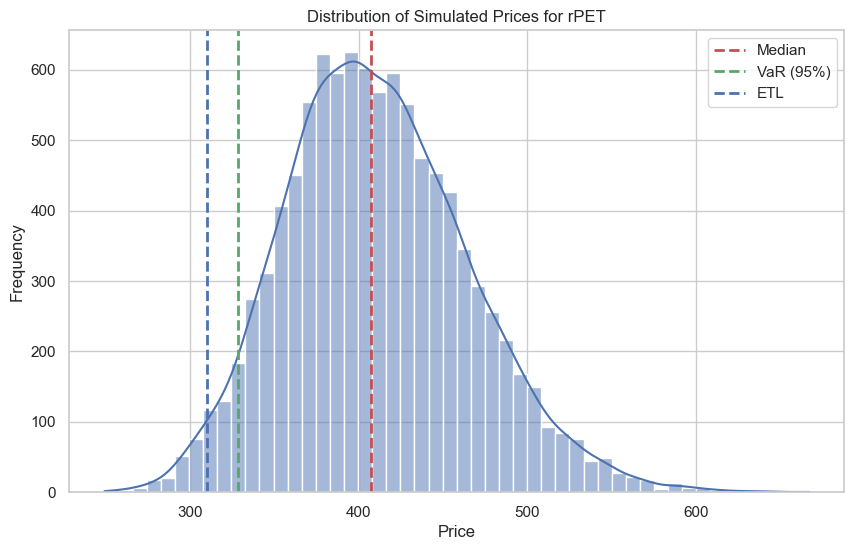


rLDPE Film:
Median Price: €465.96
95% Confidence Interval: €361.00 - €605.23
Value at Risk (VaR) at 95% confidence: €375.94
Expected Tail Loss (ETL): €355.77


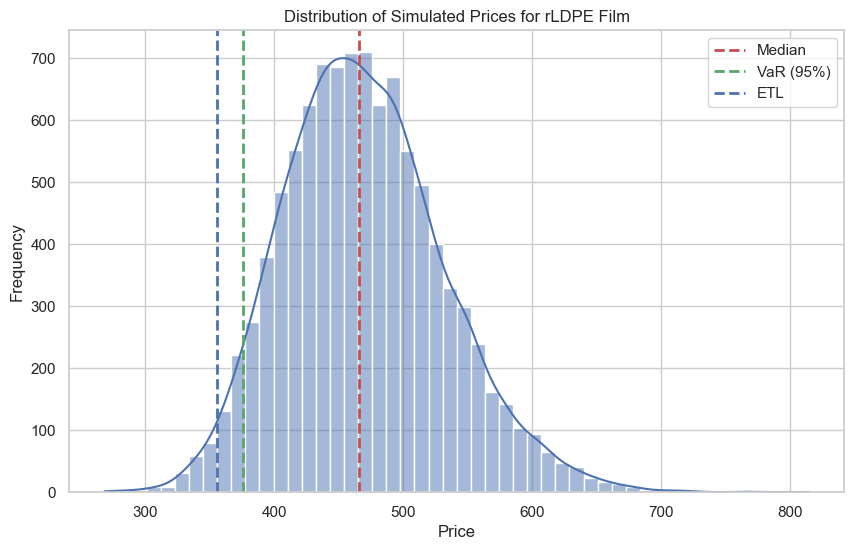


rPP:
Median Price: €724.69
95% Confidence Interval: €556.25 - €932.83
Value at Risk (VaR) at 95% confidence: €580.16
Expected Tail Loss (ETL): €549.18


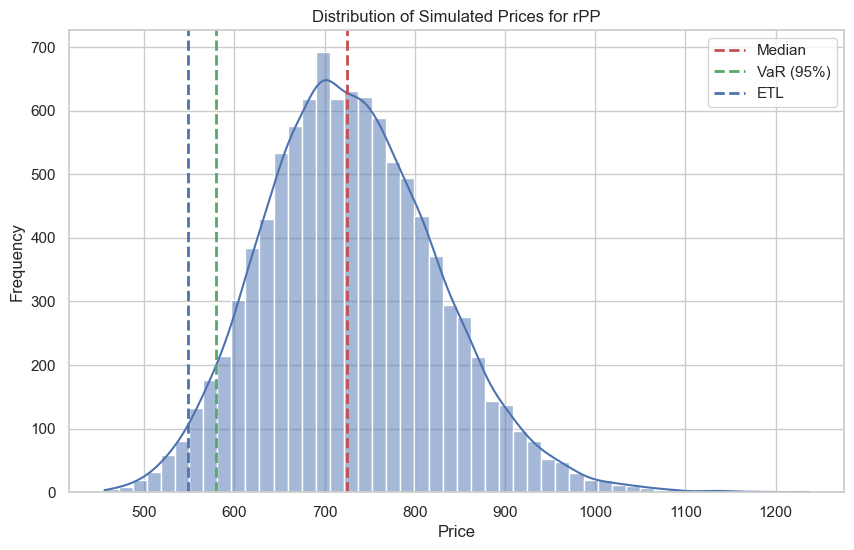


rHDPE Film:
Median Price: €515.04
95% Confidence Interval: €398.94 - €666.67
Value at Risk (VaR) at 95% confidence: €416.33
Expected Tail Loss (ETL): €394.03


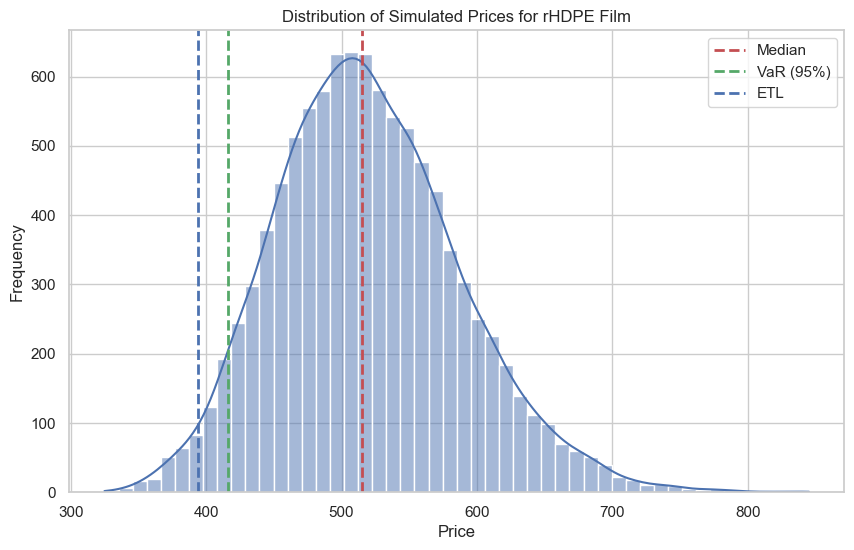

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Set the aesthetic parameters for seaborn
sns.set(style="whitegrid")

# Define the Historic data for VAR Backtesting
data = {
    'Month': ['Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 'Dec-19',
              'Jan-20', 'Feb-20', 'Mar-20', 'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20',
              'Oct-20', 'Nov-20', 'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21', 'Jun-21',
              'Jul-21', 'Aug-21', 'Sep-21', 'Oct-21', 'Nov-21', 'Dec-21', 'Jan-22', 'Feb-22', 'Mar-22',
              'Apr-22', 'May-22', 'Jun-22', 'Jul-22', 'Aug-22', 'Sep-22', 'Oct-22', 'Nov-22', 'Dec-22',
              'Jan-23', 'Feb-23', 'Mar-23', 'Apr-23', 'May-23', 'Jun-23', 'Jul-23', 'Aug-23', 'Sep-23',
              'Oct-23', 'Nov-23', 'Dec-23', 'Jan-24', 'Feb-24', 'Mar-24'],
    'HDPE film': [1166, 1182, 1166, 1102, 1074, 1027, 1037, 988, 967, 958, 958, 819, 817, 757, 809, 878,
                  914, 911, 882, 948, 958, 1140, 1435, 1744, 1858, 1523, 1465, 1350, 1354, 1413, 1388,
                  1595, 1553, 1543, 1547, 1762, 1968, 1729, 1708, 1577, 1443, 1355, 1388, 1393, 1339,
                  1313, 1299, 1334, 1229, 1122, 1065, 1016, 1118, 1158, 1175, 1076, 1063, 1186, 1265, 1280],
    'LDPE film': [1096, 1120, 1105, 1047, 1029, 964, 985, 953, 952, 944, 953, 836, 828, 762, 840, 917,
                  935, 918, 912, 1024, 1051, 1288, 1562, 1920, 2082, 1900, 1816, 1710, 1748, 1767, 1486,
                  1914, 1872, 1851, 1845, 2033, 2225, 1932, 1893, 1660, 1547, 1407, 1486, 1431, 1394,
                  1352, 1330, 1349, 1261, 1095, 979, 986, 1090, 1162, 1221, 1067, 1059, 1290, 1351, 1060],
    'PET': [170, 200, 200, 180, 200, 160, 190, 150, 210, 130, 170, 230, 220, 210, 140, 220, 160, 90, 70,
            180, 300, 160, 100, 80, 140, 70, 70, 200, 160, 180, 290, 90, 70, 0, 360, 200, 140, 250, 10,
            90, 360, 450, 400, 400, 410, 470, 340, 220, 230, 310, 300, 310, 300, 250, 320, 190, 200, 260, 260, 400],
    'PP homo-polymer fiber': [1203, 1223, 1197, 1070, 1055, 1008, 1019, 979, 995, 968, 977, 917, 917,
                              847, 893, 938, 949, 936, 921, 997, 1012, 1194, 1434, 1844, 2066, 1962,
                              1630, 1538, 1631, 1631, 1275, 1712, 1697, 1676, 1654, 1860, 2043, 1790,
                              1648, 1466, 1248, 1191, 1275, 1265, 1220, 1227, 1250, 1275, 1221, 1121,
                              1062, 1019, 1065, 1141, 1145, 1057, 1029, 1237, 1254, 1250],
    'rPET': [360, 360, 350, 330, 320, 340, 340, 340, 400, 370, 330, 310, 380, 370, 360, 340, 290, 300, 260, 300, 340, 380, 380, 380, 380, 390, 430, 480, 440, 420, 520, 520, 480, 720, 350, 390, 360, 600, 820, 720, 560, 480, 490, 550, 700, 610, 700, 550, 550, 570, 480, 450, 460, 430, 480, 450, 410, 380, 420, 410],
    'rLDPE Film': [550, 580, 520, 540, 500, 480, 510, 490, 510, 480, 470, 530, 530, 520, 500, 500, 430, 430, 470, 470, 450, 510, 470, 490, 530, 490, 470, 450, 420, 380, 340, 430, 470, 480, 430, 650, 640, 640, 790, 610, 500, 560, 600, 520, 490, 480, 470, 390, 410, 730, 180, 290, 180, 180, 290, 360, 410, 560, 550, 470],
    'rPP': [590, 600, 600, 580, 570, 570, 550, 570, 570, 560, 530, 520, 510, 530, 520, 460, 450, 490, 480, 480, 510, 510, 520, 530, 550, 600, 620, 560, 570, 620, 650, 730, 630, 650, 530, 790, 780, 670, 860, 830, 750, 790, 900, 840, 770, 780, 760, 740, 750, 740, 740, 700, 650, 640, 640, 600, 580, 600, 620, 730],
    'rHDPE Film': [570, 580, 600, 620, 600, 560, 570, 600, 600, 570, 550, 520, 520, 510, 490, 510, 490, 490, 490, 490, 490, 500, 520, 580, 620, 620, 640, 600, 630, 620, 570, 580, 600, 750, 590, 710, 630, 740, 1010, 1020, 780, 770, 760, 720, 650, 760, 750, 730, 660, 640, 670, 630, 610, 610, 640, 580, 580, 580, 570, 520]
}

# Create DataFrame from the data dictionary
df = pd.DataFrame(data)
df['Month'] = pd.to_datetime(df['Month'], format='%b-%y')
df.set_index('Month', inplace=True)

# Data Preprocessing: Identify and treat outliers using the IQR method
def treat_outliers_iqr(df):
    for column in df.columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
        df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])
    return df

# Treat outliers in the DataFrame
df = treat_outliers_iqr(df)

# Monte Carlo Simulation function using Geometric Brownian Motion (GBM)
def monte_carlo_simulation(s0, mu, sigma, n, num_scenarios, dt):
    prices = np.zeros((num_scenarios, n))
    for i in range(num_scenarios):
        price = np.zeros(n)
        price[0] = s0
        for t in range(1, n):
            simulated_return = (mu - 0.5 * sigma**2) * dt + sigma * np.sqrt(dt) * np.random.normal()
            next_price = price[t - 1] * np.exp(simulated_return)
            if next_price <= 0:
                prices[i, t:] = np.nan
                break
            price[t] = next_price
        prices[i, :t+1] = price[:t+1]
    return prices

# Simulation parameters
num_scenarios = 10000
n_months_future = 60
dt = 1 / 252

# Initialize simulated prices dictionary
simulated_prices_future = {}

# Loop over each polymer compound and perform simulation
for material in df.columns:
    s0_future = df[material].iloc[-1]
    mu = 0.003
    sigma = 0.27124
    simulated_prices_future[material] = monte_carlo_simulation(s0_future, mu, sigma, n_months_future, num_scenarios, dt)

# Function to calculate VaR and ETL
def calculate_var_etl(prices, confidence_level=0.95):
    sorted_prices = np.sort(prices)
    index_at_var = int((1 - confidence_level) * len(sorted_prices))
    var = sorted_prices[index_at_var]
    etl = sorted_prices[:index_at_var].mean()
    return var, etl

# Function to backtest VaR
def backtest_var(df, var, confidence_level=0.95):
    returns = df.pct_change().dropna()
    var_violations = (returns < -var).sum()
    expected_violations = (1 - confidence_level) * len(returns)
    return var_violations, expected_violations

# Calculate historical VaR for each material
historical_var = {}
for material in df.columns:
    returns = df[material].pct_change().dropna()
    historical_var[material] = calculate_var_etl(returns, confidence_level=0.95)[0]

# Backtest VaR for each material
backtest_results = {}
for material in df.columns:
    var_violations, expected_violations = backtest_var(df[material], historical_var[material])
    backtest_results[material] = (var_violations, expected_violations)

# Print backtest results
for material, result in backtest_results.items():
    print(f"\n{material}:")
    print(f"VaR Violations: {result[0]}")
    print(f"Expected Violations: {result[1]}")

# Plotting and calculating metrics for each material
for material in df.columns:
    prices = simulated_prices_future[material][:, -1]
    median_price = np.median(prices)
    var, etl = calculate_var_etl(prices)
    confidence_interval = np.percentile(prices, [2.5, 97.5])

    print(f"\n{material}:")
    print(f"Median Price: €{median_price:.2f}")
    print(f"95% Confidence Interval: €{confidence_interval[0]:.2f} - €{confidence_interval[1]:.2f}")
    print(f"Value at Risk (VaR) at 95% confidence: €{var:.2f}")
    print(f"Expected Tail Loss (ETL): €{etl:.2f}")

    plt.figure(figsize=(10, 6))
    sns.histplot(prices, bins=50, kde=True)
    plt.axvline(median_price, color='r', linestyle='dashed', linewidth=2, label='Median')
    plt.axvline(var, color='g', linestyle='dashed', linewidth=2, label='VaR (95%)')
    plt.axvline(etl, color='b', linestyle='dashed', linewidth=2, label='ETL')
    plt.title(f'Distribution of Simulated Prices for {material}')
    plt.xlabel('Price')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()


**Python Code for Monte Carlo Simulation Normal Distribution and VaR Backtesting model validation and Expected Violations based on Forecasted Data**


HDPE film:
VaR Violations: 54
Expected Violations: 2.950000000000003

LDPE film:
VaR Violations: 56
Expected Violations: 2.950000000000003

PET:
VaR Violations: 52
Expected Violations: 2.950000000000003

PP homo-polymer fiber:
VaR Violations: 56
Expected Violations: 2.950000000000003

HDPE film:
Median Price: €1275.18
95% Confidence Interval: €986.02 - €1650.74
Value at Risk (VaR) at 95% confidence: €1027.84
Expected Tail Loss (ETL): €973.32


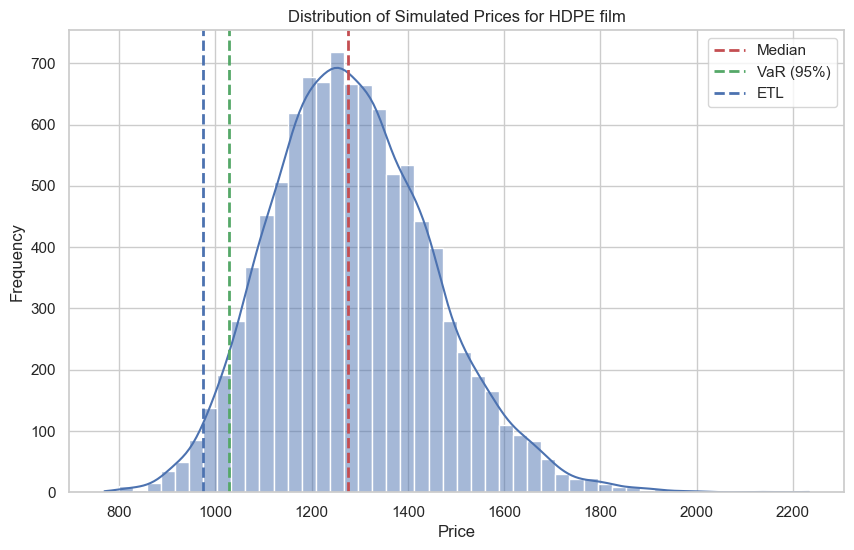


LDPE film:
Median Price: €1051.37
95% Confidence Interval: €817.25 - €1358.66
Value at Risk (VaR) at 95% confidence: €854.35
Expected Tail Loss (ETL): €807.48


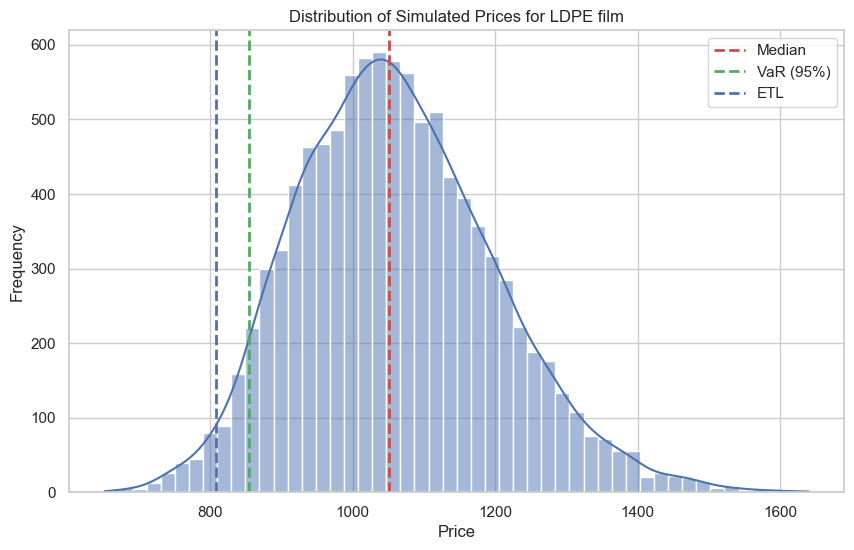


PET:
Median Price: €397.03
95% Confidence Interval: €306.88 - €509.70
Value at Risk (VaR) at 95% confidence: €321.60
Expected Tail Loss (ETL): €303.21


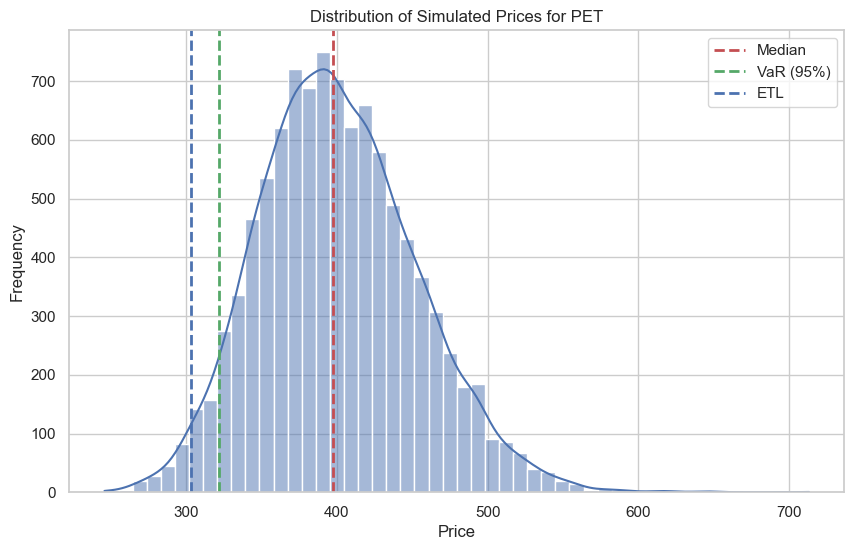


PP homo-polymer fiber:
Median Price: €1237.02
95% Confidence Interval: €960.19 - €1599.54
Value at Risk (VaR) at 95% confidence: €998.23
Expected Tail Loss (ETL): €948.36


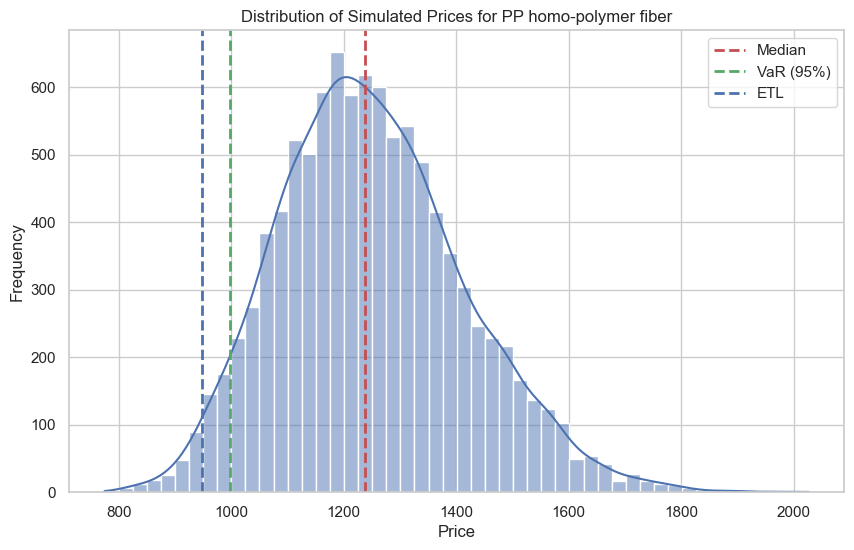

In [4]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Data for Forecasted Prices for backtesting

# Set the aesthetic parameters for seaborn
sns.set(style="whitegrid")

# Data for HDPE film
hdpe_data = {
    "Month/Year": [
        "April 2024", "May 2024", "June 2024", "July 2024", "August 2024", "September 2024", "October 2024", "November 2024", "December 2024",
        "January 2025", "February 2025", "March 2025", "April 2025", "May 2025", "June 2025", "July 2025", "August 2025", "September 2025", "October 2025", "November 2025", "December 2025",
        "January 2026", "February 2026", "March 2026", "April 2026", "May 2026", "June 2026", "July 2026", "August 2026", "September 2026", "October 2026", "November 2026", "December 2026",
        "January 2027", "February 2027", "March 2027", "April 2027", "May 2027", "June 2027", "July 2027", "August 2027", "September 2027", "October 2027", "November 2027", "December 2027",
        "January 2028", "February 2028", "March 2028", "April 2028", "May 2028", "June 2028", "July 2028", "August 2028", "September 2028", "October 2028", "November 2028", "December 2028",
        "January 2029", "February 2029", "March 2029"
    ],
    "HDPE film": [
        1280.00, 1280.05, 1280.11, 1280.21, 1280.25, 1280.46, 1280.45, 1280.31, 1280.63,
        1280.60, 1280.88, 1280.85, 1280.97, 1281.03, 1281.24, 1281.32, 1281.78, 1281.76, 1281.60, 1281.66, 1281.88,
        1281.99, 1281.85, 1282.05, 1281.95, 1281.65, 1281.31, 1281.32, 1281.52, 1281.43, 1281.19, 1280.97, 1281.09,
        1281.04, 1281.19, 1281.04, 1280.96, 1281.04, 1281.10, 1281.06, 1281.07, 1281.36, 1281.72, 1281.45, 1281.51,
        1281.35, 1281.08, 1281.32, 1281.15, 1281.07, 1281.29, 1281.00, 1280.72, 1280.93, 1281.50, 1281.56, 1281.52,
        1281.42, 1281.71, 1281.91
    ]
}

# Data for LDPE film
ldpe_data = {
    "Month/Year": hdpe_data["Month/Year"],
    "LDPE film": [
        1060.00, 1060.25, 1060.44, 1060.29, 1060.07, 1059.84, 1059.82, 1060.14, 1060.18,
        1060.40, 1060.71, 1060.70, 1060.72, 1060.75, 1061.26, 1061.46, 1061.38, 1061.52, 1061.69, 1061.93, 1062.06,
        1061.98, 1061.60, 1061.99, 1062.07, 1062.10, 1062.14, 1062.26, 1062.29, 1062.10, 1061.88, 1061.73, 1061.96,
        1062.03, 1062.09, 1061.73, 1061.98, 1061.62, 1061.43, 1061.31, 1061.45, 1061.70, 1061.53, 1061.53, 1061.69,
        1062.11, 1062.14, 1062.00, 1062.22, 1062.11, 1062.02, 1062.17, 1062.18, 1062.05, 1061.77, 1062.01, 1061.85,
        1061.61, 1061.08, 1060.91
    ]
}

# Data for PET
pet_data = {
    "Month/Year": hdpe_data["Month/Year"],
    "PET": [
        400.00, 399.95, 399.94, 399.93, 399.98, 399.97, 400.01, 399.97, 399.95,
        400.00, 399.99, 399.95, 400.05, 400.02, 399.99, 400.00, 399.92, 400.03, 400.05, 400.04, 400.07,
        400.06, 399.99, 399.97, 399.96, 399.93, 400.01, 400.11, 400.12, 400.07, 400.18, 400.34, 400.36,
        400.41, 400.45, 400.56, 400.56, 400.48, 400.39, 400.48, 400.37, 400.42, 400.46, 400.52, 400.48,
        400.40, 400.41, 400.37, 400.42, 400.39, 400.34, 400.36, 400.37, 400.33, 400.35, 400.27, 400.20,
        400.19, 400.11, 399.98
    ]
}

# Data for PP homo-polymer fiber
pp_data = {
    "Month/Year": hdpe_data["Month/Year"],
    "PP homo-polymer fiber": [
        1250.00, 1250.26, 1250.58, 1250.66, 1250.94, 1250.94, 1250.90, 1250.97, 1251.14,
        1250.97, 1251.22, 1251.38, 1251.58, 1251.68, 1251.64, 1251.69, 1251.63, 1251.99, 1251.77, 1251.79, 1252.01,
        1251.69, 1251.71, 1251.81, 1251.85, 1252.10, 1251.95, 1251.91, 1251.61, 1251.63, 1252.14, 1252.20, 1252.22,
        1252.06, 1252.15, 1252.10, 1251.97, 1252.08, 1252.05, 1252.16, 1251.72, 1251.65, 1251.68, 1251.33, 1251.20,
        1251.20, 1250.99, 1250.69, 1250.45, 1250.37, 1250.35, 1250.50, 1250.05, 1249.74, 1249.72, 1250.10, 1250.33,
        1250.44, 1250.32, 1250.15
    ]
}

# Create DataFrames
df_hdpe = pd.DataFrame(hdpe_data)
df_ldpe = pd.DataFrame(ldpe_data)
df_pet = pd.DataFrame(pet_data)
df_pp = pd.DataFrame(pp_data)

# Merge DataFrames on "Month/Year"
df = df_hdpe.merge(df_ldpe, on="Month/Year").merge(df_pet, on="Month/Year").merge(df_pp, on="Month/Year")

# Convert "Month/Year" to datetime
df["Month/Year"] = pd.to_datetime(df["Month/Year"], format="%B %Y")
df.set_index("Month/Year", inplace=True)

# Data Preprocessing: Identify and treat outliers using the IQR method
def treat_outliers_iqr(df):
    for column in df.columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
        df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])
    return df

# Treat outliers in the DataFrame
df = treat_outliers_iqr(df)

# Monte Carlo Simulation function using Geometric Brownian Motion (GBM)
def monte_carlo_simulation(s0, mu, sigma, n, num_scenarios, dt):
    prices = np.zeros((num_scenarios, n))
    for i in range(num_scenarios):
        price = np.zeros(n)
        price[0] = s0
        for t in range(1, n):
            simulated_return = (mu - 0.5 * sigma**2) * dt + sigma * np.sqrt(dt) * np.random.normal()
            next_price = price[t - 1] * np.exp(simulated_return)
            if next_price <= 0:
                prices[i, t:] = np.nan
                break
            price[t] = next_price
        prices[i, :t+1] = price[:t+1]
    return prices

# Simulation parameters
num_scenarios = 10000
n_months_future = 60
dt = 1 / 252

# Initialize simulated prices dictionary
simulated_prices_future = {}

# Loop over each polymer compound and perform simulation
for material in df.columns:
    s0_future = df[material].iloc[-1]
    mu = 0.003
    sigma = 0.27124
    simulated_prices_future[material] = monte_carlo_simulation(s0_future, mu, sigma, n_months_future, num_scenarios, dt)

# Function to calculate VaR and ETL
def calculate_var_etl(prices, confidence_level=0.95):
    sorted_prices = np.sort(prices)
    index_at_var = int((1 - confidence_level) * len(sorted_prices))
    var = sorted_prices[index_at_var]
    etl = sorted_prices[:index_at_var].mean()
    return var, etl

# Function to backtest VaR
def backtest_var(df, var, confidence_level=0.95):
    returns = df.pct_change().dropna()
    var_violations = (returns < -var).sum()
    expected_violations = (1 - confidence_level) * len(returns)
    return var_violations, expected_violations

# Calculate historical VaR for each material
historical_var = {}
for material in df.columns:
    returns = df[material].pct_change().dropna()
    historical_var[material] = calculate_var_etl(returns, confidence_level=0.95)[0]

# Backtest VaR for each material
backtest_results = {}
for material in df.columns:
    var_violations, expected_violations = backtest_var(df[material], historical_var[material])
    backtest_results[material] = (var_violations, expected_violations)

# Print backtest results
for material, result in backtest_results.items():
    print(f"\n{material}:")
    print(f"VaR Violations: {result[0]}")
    print(f"Expected Violations: {result[1]}")

# Plotting and calculating metrics for each material
for material in df.columns:
    prices = simulated_prices_future[material][:, -1]
    median_price = np.median(prices)
    var, etl = calculate_var_etl(prices)
    confidence_interval = np.percentile(prices, [2.5, 97.5])

    print(f"\n{material}:")
    print(f"Median Price: €{median_price:.2f}")
    print(f"95% Confidence Interval: €{confidence_interval[0]:.2f} - €{confidence_interval[1]:.2f}")
    print(f"Value at Risk (VaR) at 95% confidence: €{var:.2f}")
    print(f"Expected Tail Loss (ETL): €{etl:.2f}")

    plt.figure(figsize=(10, 6))
    sns.histplot(prices, bins=50, kde=True)
    plt.axvline(median_price, color='r', linestyle='dashed', linewidth=2, label='Median')
    plt.axvline(var, color='g', linestyle='dashed', linewidth=2, label='VaR (95%)')
    plt.axvline(etl, color='b', linestyle='dashed', linewidth=2, label='ETL')
    plt.title(f'Distribution of Simulated Prices for {material}')
    plt.xlabel('Price')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()


**Summary Statistics for VaR Backtesting model validation comparing Expected VaR Violations in both Historical v/s Forecasted Data**

In [7]:
import pandas as pd

# Data for VaR backtesting results
data = {
    "Polymer Type": ["HDPE film", "LDPE film", "PET", "PP homo-polymer fiber"],
    "VaR Violations (Historical)": [54, 54, 52, 54],
    "Expected Violations (Historical)": [2.95, 2.95, 2.95, 2.95],
    "VaR Violations (Forecasted)": [54, 56, 52, 56],
    "Expected Violations (Forecasted)": [2.95, 2.95, 2.95, 2.95]
}

# Create a DataFrame
df = pd.DataFrame(data)

# Print the DataFrame
print(df)

# Describe the DataFrame
print("\nDescription of VaR Backtesting Results:")
print(df.describe())


            Polymer Type  VaR Violations (Historical)  \
0              HDPE film                           54   
1              LDPE film                           54   
2                    PET                           52   
3  PP homo-polymer fiber                           54   

   Expected Violations (Historical)  VaR Violations (Forecasted)  \
0                              2.95                           54   
1                              2.95                           56   
2                              2.95                           52   
3                              2.95                           56   

   Expected Violations (Forecasted)  
0                              2.95  
1                              2.95  
2                              2.95  
3                              2.95  

Description of VaR Backtesting Results:
       VaR Violations (Historical)  Expected Violations (Historical)  \
count                          4.0                              4.00  